# Import libraries we need and set some parameters

In [1]:
import sys
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
from scipy.sparse import csr_matrix
import logging
import os
import matplotlib.pyplot as plt
import seaborn as sns
import csv
import scipy.stats as stats
import statsmodels.formula.api as smf
import statsmodels.api as sm
import math
import gc
import random
from sklearn.utils import shuffle

In [2]:
%matplotlib inline

##################
# Configure file #
##################
sc.settings.verbosity = 2
sc.settings.autoshow = False

sc.settings.set_figure_params(dpi=100, dpi_save=600, format='png')

plt.rcParams["image.aspect"] = "equal"

# Read in the data

In [3]:
version = "V6.1"

dirpath = os.getcwd()
name = "CLUESImmVar_processed"##+version
processed_path = name+'.'+version+'.h5ad';
print(processed_path)
adata = sc.read(processed_path, cache=True)
adata.shape

figdir = "./figures."+version+"/"
sc.settings.figdir = "./figures."+version+"/"

CLUESImmVar_processed.V6.1.h5ad
Only considering the two last: ['.1', '.h5ad'].
Only considering the two last: ['.1', '.h5ad'].


In [4]:
## since we have replicates, let's sort adata in a consistent way
adata_obs_sorted = adata.obs.sort_values(by=['disease_cov','ind_cov','batch_cov'], ascending=False);
adata = adata[adata_obs_sorted.index]

In [5]:
adata.obs['site'] = pd.Categorical(adata.obs.disease_cov, categories=['Broad','UCSF'])
adata.obs.site[adata.obs.batch_cov.str.contains("immvar")] = "Broad"
adata.obs.site[~adata.obs.batch_cov.str.contains("immvar")] = "UCSF"

adata.obs['disease_pop_site_cov'] = pd.Categorical(adata.obs.apply(lambda row: row['disease_cov'] + row['pop_cov'] + row['site'], axis=1),
                                             categories=['healthyWHITEBroad','healthyWHITEUCSF','sleWHITEUCSF','sleASIANUCSF'],
                                             ordered=True)

Trying to set attribute `.obs` of view, making a copy.


In [6]:
adata.obs.to_csv('adata_obs.'+version+'.txt')

# Figure 1B: Cell type annotation of projection

## Plot leiden and annotate the clusters

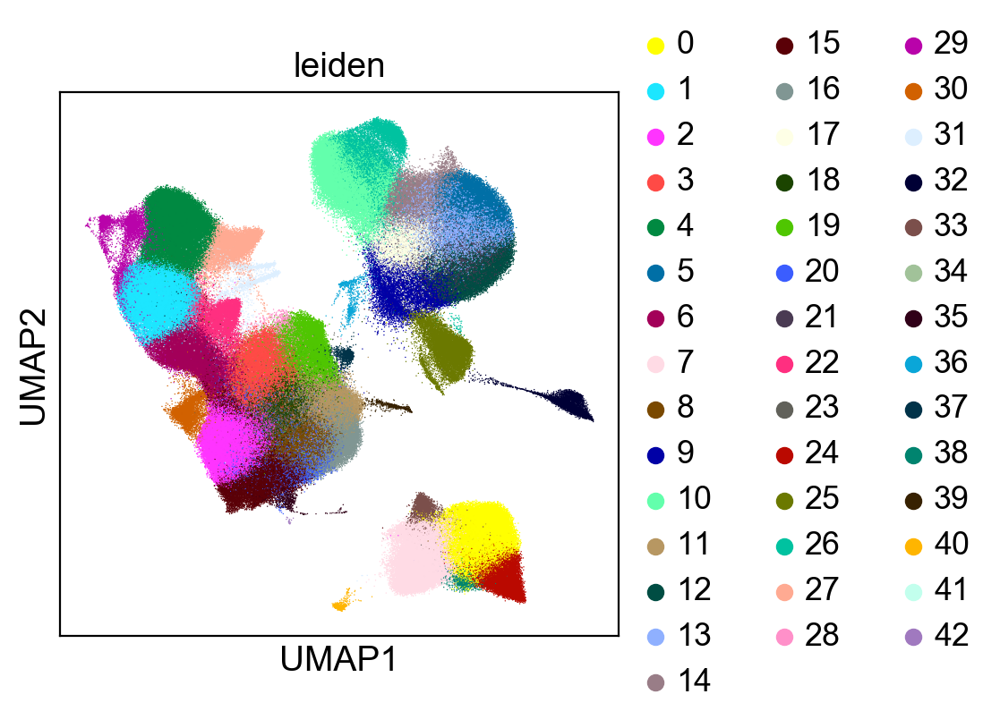

In [7]:
sc.pl.umap(adata, color='leiden',size=1, edgecolor="none")
sc.pl.umap(adata, color='leiden', size=1, edgecolor="none", save='_leiden.png')

In [8]:
##4/11 annotations
adata.obs.ct_cov = adata.obs.ct_cov.astype("str")
# ## do some manual cell type assignment
adata.obs.ct_cov.loc[adata.obs.leiden == "0"] = "B" ## good                                                                                    
adata.obs.ct_cov.loc[adata.obs.leiden == "1"] = "Tc" ## good                                                                                    
adata.obs.ct_cov.loc[adata.obs.leiden == "2"] = "Tc" ## good                                                                                     
adata.obs.ct_cov.loc[adata.obs.leiden == "3"] = "Th" ## good                                                                                    
adata.obs.ct_cov.loc[adata.obs.leiden == "4"] = "NK" ## good                                                                                    
adata.obs.ct_cov.loc[adata.obs.leiden == "5"] = "cM" ## good                                                                                    
adata.obs.ct_cov.loc[adata.obs.leiden == "6"] = "Tc" ## good                                                                                    
adata.obs.ct_cov.loc[adata.obs.leiden == "7"] = "B" ## good                                                                                    
adata.obs.ct_cov.loc[adata.obs.leiden == "8"] = "Th" ## good                                                                                    
adata.obs.ct_cov.loc[adata.obs.leiden == "9"] = "cM" ## good                                                                                    
adata.obs.ct_cov.loc[adata.obs.leiden == "10"] = "ncM" ## good                                                                                  
adata.obs.ct_cov.loc[adata.obs.leiden == "11"] = "Th" ## good                                                                                    
adata.obs.ct_cov.loc[adata.obs.leiden == "12"] = "cM" ## good                                                                                   
adata.obs.ct_cov.loc[adata.obs.leiden == "13"] = "cM" ## good                                                                                   
adata.obs.ct_cov.loc[adata.obs.leiden == "14"] = "cM" ## good                                                                                  
adata.obs.ct_cov.loc[adata.obs.leiden == "15"] = "Th" ## good                                                                                   
adata.obs.ct_cov.loc[adata.obs.leiden == "16"] = "Th" ## good                                                                                   
adata.obs.ct_cov.loc[adata.obs.leiden == "17"] = "cM" ## good                                                                                  
adata.obs.ct_cov.loc[adata.obs.leiden == "18"] = "Th" ## good                                                                              
adata.obs.ct_cov.loc[adata.obs.leiden == "19"] = "Th" ## good                                                                               
adata.obs.ct_cov.loc[adata.obs.leiden == "20"] = "Th" ## good 
adata.obs.ct_cov.loc[adata.obs.leiden == "21"] = "cM" ## good                                                                                    
adata.obs.ct_cov.loc[adata.obs.leiden == "22"] = "Tc" ## good                                                                                   
adata.obs.ct_cov.loc[adata.obs.leiden == "23"] = "Th" ## good                                                                                   
adata.obs.ct_cov.loc[adata.obs.leiden == "24"] = "B" ## good                                                                                  
adata.obs.ct_cov.loc[adata.obs.leiden == "25"] = "cDC" ## good                                                                                   
adata.obs.ct_cov.loc[adata.obs.leiden == "26"] = "ncM" ## good                                                                                   
adata.obs.ct_cov.loc[adata.obs.leiden == "27"] = "NK" ## good                                                                                  
adata.obs.ct_cov.loc[adata.obs.leiden == "28"] = "Th" ## good 
adata.obs.ct_cov.loc[adata.obs.leiden == "29"] = "NK" ## good                                                                               
adata.obs.ct_cov.loc[adata.obs.leiden == "30"] = "DB" ## good 
adata.obs.ct_cov.loc[adata.obs.leiden == "31"] = "ProlifT" ## good                                                                                    
adata.obs.ct_cov.loc[adata.obs.leiden == "32"] = "pDC" ## good
adata.obs.ct_cov.loc[adata.obs.leiden == "33"] = "B" ## good                                                                                   
adata.obs.ct_cov.loc[adata.obs.leiden == "34"] = "cM" ## good                                                                                  
adata.obs.ct_cov.loc[adata.obs.leiden == "35"] = "DB" ## good                                                                                   
adata.obs.ct_cov.loc[adata.obs.leiden == "36"] = "MK" ## good                                                                                   
adata.obs.ct_cov.loc[adata.obs.leiden == "37"] = "DB" ## good                                                                                  
adata.obs.ct_cov.loc[adata.obs.leiden == "38"] = "B" ## good 
adata.obs.ct_cov.loc[adata.obs.leiden == "39"] = "Progen" ## good                                                                               
adata.obs.ct_cov.loc[adata.obs.leiden == "40"] = "B" ## good 
adata.obs.ct_cov.loc[adata.obs.leiden == "41"] = "DB" ## good                                                                                    
adata.obs.ct_cov.loc[adata.obs.leiden == "42"] = "DB" ## good
adata.obs.ct_cov.loc[adata.obs.leiden == "43"] = "DB" ## good
adata.obs.ct_cov = adata.obs.ct_cov.astype('category')

/Users/yimmieg/opt/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


## Plot Figure 1B

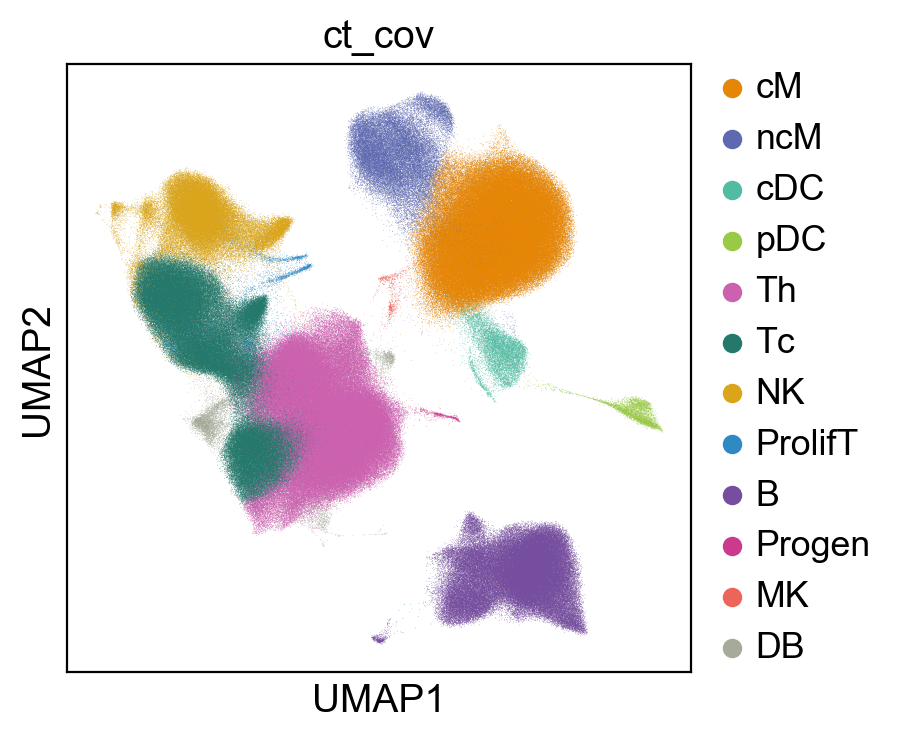

In [9]:
## Make cell type plot (Fig. 1C)
adata.obs.ct_cov = adata.obs.ct_cov.cat.reorder_categories(['cM', 'ncM', 'cDC', 'pDC', 'Th', 'Tc', 'NK', 'ProlifT', 'B', 'Progen', 'MK', 'DB'])

adata.uns['ct_cov_colors'] = ["#E58606","#5D69B1","#52BCA3","#99C945","#CC61B0","#24796C","#DAA51B","#2F8AC4","#764E9F","#CC3A8E","#ED645A","#A5AA99"]

celltype_umap = sc.pl.umap(adata, color='ct_cov', size=0.2, edgecolor="none", save='_celltype.png')
celltype_umap = sc.pl.umap(adata, color='ct_cov',size=0.2, edgecolor="none")

## Rank genes and save differentially expressed genes by cluster

In [10]:
sc.tl.rank_genes_groups(adata, groupby="ct_cov", use_raw=True, n_genes=adata.shape[1])

ranking genes
    finished (0:04:56)


In [11]:
pd.DataFrame(adata.uns["rank_genes_groups"]['names']).to_csv("rank_gene_groups."+version+".txt")

## Feature plotting for supplements

### CD4, CD8 and NK axes

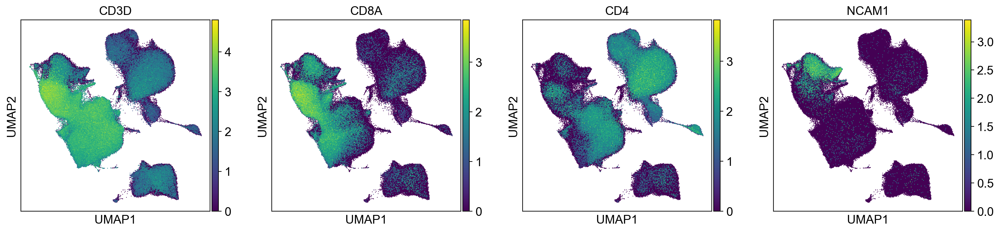

In [12]:
sc.pl.umap(adata, color=["CD3D","CD8A","CD4","NCAM1"],size=3)
sc.pl.umap(adata, color=["CD3D","CD8A","CD4","NCAM1"],size=3, save="_TNK.png")

### Platelets

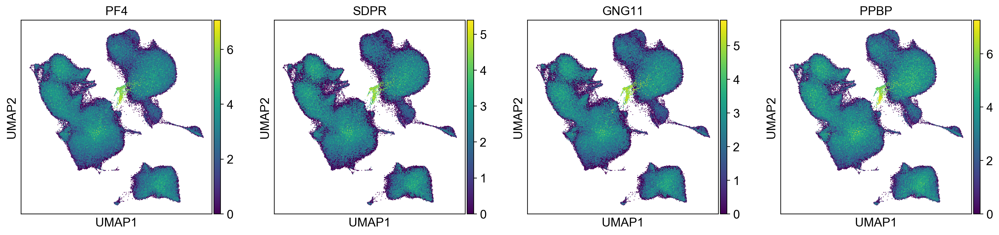

In [13]:
sc.pl.umap(adata, color=["PF4", "SDPR", "GNG11", "PPBP"], size=3)
sc.pl.umap(adata, color=["PF4", "SDPR", "GNG11", "PPBP"], size=3, save='_platelet.png')

### Cycling

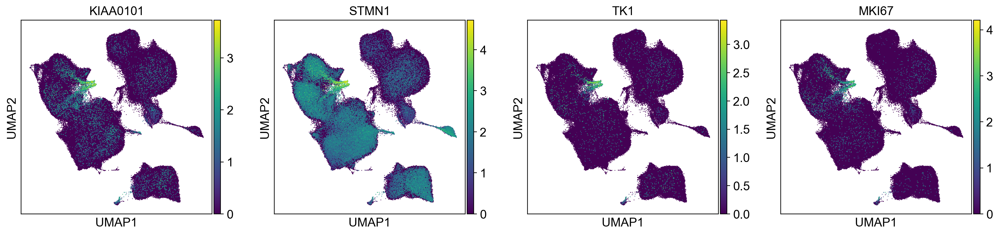

In [14]:
sc.pl.umap(adata, color=["KIAA0101","STMN1","TK1","MKI67"], size=3)
sc.pl.umap(adata, color=["KIAA0101","STMN1","TK1","MKI67"], size=3, save='_cycling.png')

### Regulatory T cells

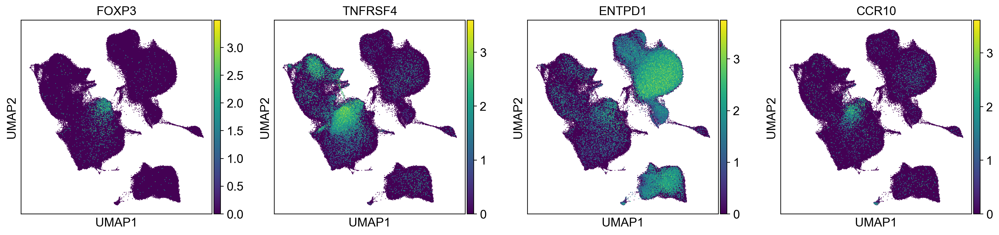

In [15]:
sc.pl.umap(adata, color=["FOXP3","TNFRSF4","ENTPD1","CCR10"],size=3)
sc.pl.umap(adata, color=["PF4", "SDPR", "GNG11", "PPBP"], size=3, save='_treg.png')

### Gender specific genes

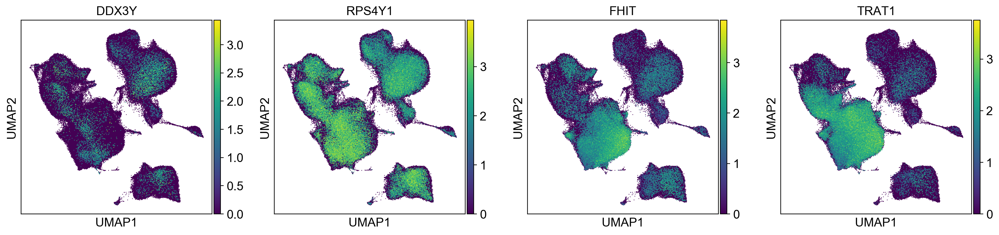

In [16]:
sc.pl.umap(adata, color=["DDX3Y", "RPS4Y1", "FHIT","TRAT1"], size =3)
sc.pl.umap(adata, color=["PF4", "SDPR", "GNG11", "PPBP"], size=3, save='_gender.png')

### B cells, plasmabalsts and pDCs

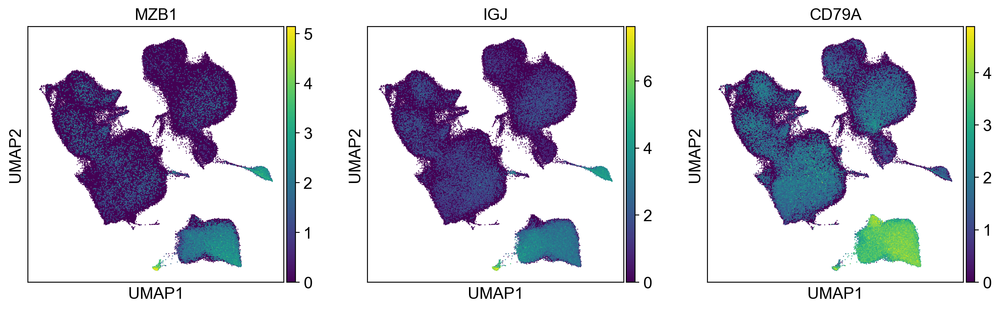

In [17]:
sc.pl.umap(adata, color=["MZB1", "IGJ", "CD79A"],size=3)
sc.pl.umap(adata, color=["PF4", "SDPR", "GNG11", "PPBP"], size=3, save='_bpbpdc.png')

# Figure 1C: Density plot for cases vs controls (this takes a while)

In [18]:
sc.tl.embedding_density(adata, basis='umap', groupby='disease_pop_site_cov')

computing density on 'umap'


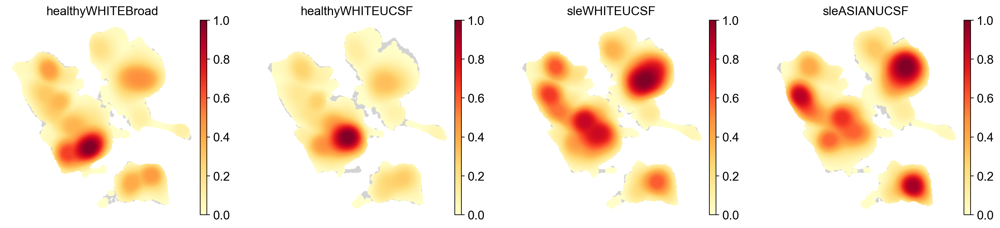

In [19]:
disease_umap = sc.pl.embedding_density(adata, basis="umap", key="umap_density_disease_pop_site_cov", frameon=False)
disease_umap = sc.pl.embedding_density(adata, basis="umap", key="umap_density_disease_pop_site_cov", frameon=False, save=".png")

# Figure 1D: Plot for each of the 16 people in batch 1 as a demo of variability

## Make only the first batch for Figure 1D

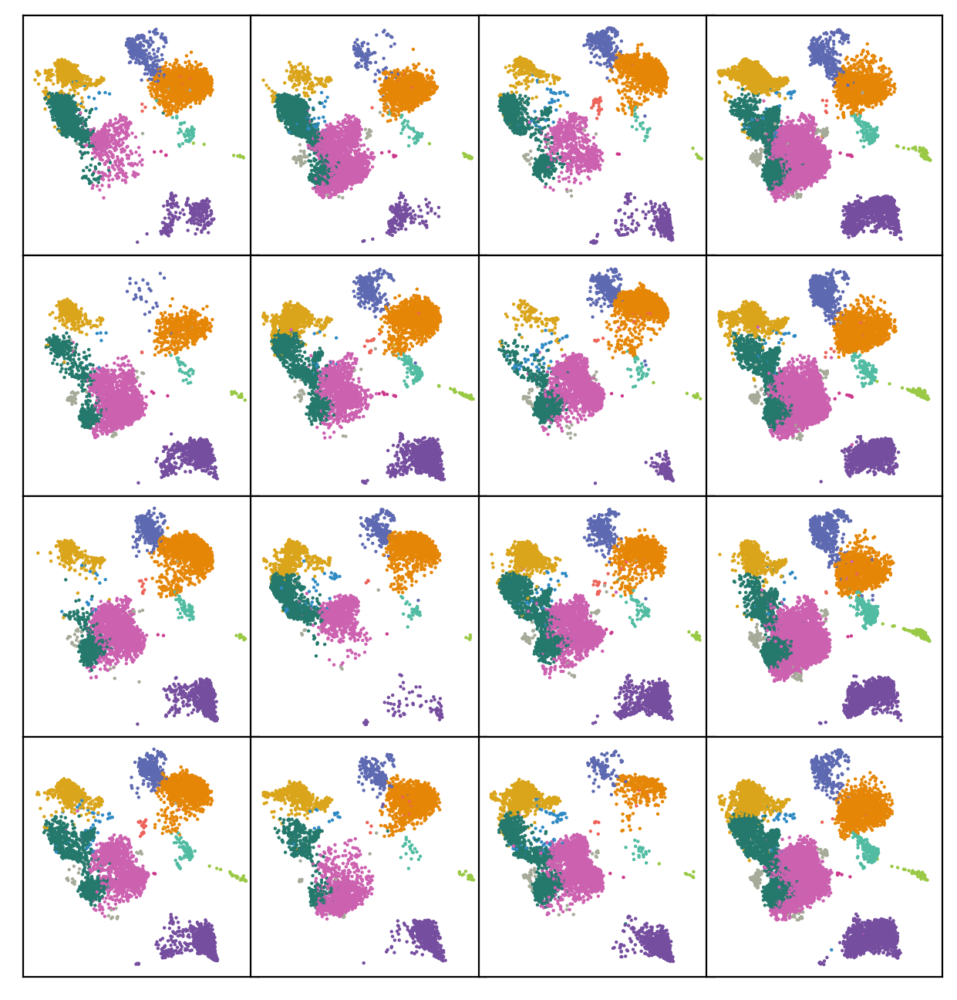

In [20]:
batch_07_19_inds = adata.obs.ind_cov[adata.obs.batch_cov=='lupus7.19'].unique()
batch_07_19_inds = np.sort(batch_07_19_inds.categories.values);

fig,ax = plt.subplots(nrows=4,ncols=4, figsize=(7,7), sharex=True, sharey=True)
fig.tight_layout()
plt.subplots_adjust(wspace=-0.1, hspace=0)

for ind_i in list(range(batch_07_19_inds.shape[0])) :
    ind = batch_07_19_inds[ind_i]
    
    sc.pl.umap(adata[adata.obs.ind_cov==ind,], color = "ct_cov", title=None, ax=ax[(ind_i-1)%4,math.floor(ind_i/4)], size=10, edgecolor="none")
    
    ax[(ind_i-1)%4,math.floor(ind_i/4)].get_xaxis().set_visible(False)
    ax[(ind_i-1)%4,math.floor(ind_i/4)].get_yaxis().set_visible(False)
    ax[(ind_i-1)%4,math.floor(ind_i/4)].get_legend().remove()
    ax[(ind_i-1)%4,math.floor(ind_i/4)].set_title("")
    ax[(ind_i-1)%4,math.floor(ind_i/4)].set_aspect("equal")

fig.savefig(figdir+'/umap_ind.png')

## Make all batches for supplementary materials (this could take a while)

In [21]:
# ## let's plot 16 plots for the individuals in the first batch (Fig. 1B)

# for batch_i in range(7,14): ##range(len(adata.obs.batch_cov.unique())) :
#     fig,ax = plt.subplots(nrows=4,ncols=4, figsize=(7,7),sharex=True, sharey=True)
#     fig.tight_layout()
#     plt.subplots_adjust(wspace=-0.1, hspace=0)

#     batch_name = adata.obs.batch_cov.unique()[batch_i]
#     batch = adata.obs.ind_cov[adata.obs.batch_cov==batch_name].unique();
#     batch = np.sort(batch.categories.values)

#     for ind_i in list(range(batch.shape[0])) :
#         ind = batch[ind_i]

#         sc.pl.umap(adata[adata.obs.ind_cov==ind,], color = "ct_cov", title=None, ax=ax[(ind_i-1)%4,math.floor(ind_i/4)], size=20, edgecolor="none")
        
#         ax[(ind_i-1)%4,math.floor(ind_i/4)].get_xaxis().set_visible(False)
#         ax[(ind_i-1)%4,math.floor(ind_i/4)].get_yaxis().set_visible(False)
#         ax[(ind_i-1)%4,math.floor(ind_i/4)].get_legend().remove()
#         ax[(ind_i-1)%4,math.floor(ind_i/4)].set_title("")
#         ax[(ind_i-1)%4,math.floor(ind_i/4)].set_aspect("equal")
    
#     fig.savefig(figdir+'/'+batch_name+'_ind.png')

# Figure 1F: Cell type proportion differences between case/control

## Let's first look at reproducibility of healthy controls

In [22]:
adata_obs_small = adata.obs[(adata.obs.well.str.contains("immvar")) & (adata.obs.ind_cov.str.contains("IGTB")) | (~adata.obs.ind_cov.str.contains("IGTB") & ~adata.obs.well.str.contains("immvar"))]
ind_count = adata_obs_small.groupby(['ind_cov','ct_cov','disease_cov','pop_cov',"batch_cov"])['ct_cov'].count()
ind_count_sums = ind_count.groupby(level=[0]).sum()
ind_count_sums = ind_count_sums.reset_index(name="pbmc_counts")

ind_perc = ind_count/ind_count.groupby(level=[0]).transform(sum)*100
ind_perc = ind_perc.reset_index(name="ct_perc")

# Add weights to WLS
ind_perc['ct_counts'] = ind_count.values.tolist()

## filter samples that have < 100 cells
ind_perc = ind_perc[ind_perc.ind_cov.isin(ind_count_sums.ind_cov[ind_count_sums.pbmc_counts > 100])]

##ct_group = pd.DataFrame( {'ct_cov':['B','CD14 Monoc','CD16 Monoc', 'CD4+ T', 'CD8+ T', 'MK', 'NK', 'cDC', 'pDC','Progenitor','Proliferat'], 'ct_group':['lymph', 'mono', 'mono', 'lymph','lymph', 'mkc','lymph','dc','pdc','progen','lymph']})
cg_cov = pd.DataFrame( {'ct_cov':['B','cM','ncM', 'Th', 'Tc', 'NK', 'ProlifT', 'cDC', 'pDC', 'MK', 'Progen'], 'cg_cov':['lymph', 'mono', 'mono', 'lymph','lymph', 'lymph', 'lymph', 'cdc','pdc', 'mk', 'progen']})
ind_perc.ind_cov = ind_perc.ind_cov.apply(lambda x: x.split('_')[0])
ind_count_sums.ind_cov = ind_count_sums.ind_cov.apply(lambda x: x.split('_')[0])
ind_perc = ind_perc.set_index('ct_cov').join(cg_cov.set_index('ct_cov'))
ind_perc.ind_cov = ind_perc.ind_cov.astype("str")
##ind_perc.batch_cov = ind_perc.batch_cov.astype("str")
ind_perc.reset_index(inplace=True)
ind_perc.ct_cov = ind_perc.ct_cov.astype('category')
ind_perc.ct_cov = ind_perc.ct_cov.cat.reorder_categories(adata.obs.ct_cov.cat.categories.values)

In [23]:
adata_obs_small = adata.obs[(adata.obs.batch_cov.str.contains("lupus"))& (adata.obs.ind_cov.str.contains("IGTB"))]

ind_count2 = adata_obs_small.groupby(['ind_cov','ct_cov','disease_cov','pop_cov',"batch_cov"])['ct_cov'].count()

##ind_count = ind_count.reset_index(name="counts")
ind_count2_sums = ind_count2.groupby(["ind_cov","batch_cov"]).sum()
ind_count2_sums = ind_count2_sums.reset_index(name="pbmc_counts")

##ind_count2_sums = ind_count2.groupby(level=[0]).sum()
##ind_count2_sums = ind_count2_sums.reset_index(name="counts")

ind_count2 = ind_count2.reset_index(name="counts")
# ind_count2["ind_batch_cov"] = ind_count2['ind_cov'].astype(str)+ind_count2['batch_cov'].astype(str);

ind_perc2 = ind_count2;
ind_perc2['ct_perc'] = ind_count2["counts"]/ind_count2.groupby(["ind_cov","batch_cov"]).transform(sum)["counts"]*100
##ind_perc2 = ind_count2["counts"]/ind_count2.groupby(["ind_batch_cov"]).transform(sum)*100
##ind_perc2 = ind_count2/ind_count2_sums*100
##ind_perc2 = ind_perc2.reset_index(name="ct_perc")
ind_perc2['disease_pop_cov'] = pd.Categorical(ind_perc2.apply(lambda row: row['disease_cov'] + row['pop_cov'], axis=1),
                                             categories=['healthyWHITE','sleWHITE','sleASIAN'],
                                             ordered=True)

cg_cov = pd.DataFrame( {'ct_cov':['B','cM','ncM', 'Th', 'Tc', 'NK', 'ProlifT', 'cDC', 'pDC', 'MK', 'Progen'], 'cg_cov':['lymph', 'mono', 'mono', 'lymph','lymph', 'lymph', 'lymph', 'cdc','pdc', 'mk', 'progen']})
ind_perc2.ind_cov = ind_perc2.ind_cov.apply(lambda x: x.split('_')[0])
ind_count2_sums.ind_cov = ind_count2_sums.ind_cov.apply(lambda x: x.split('_')[0])
ind_perc2 = ind_perc2.set_index('ct_cov').join(cg_cov.set_index('ct_cov'))
ind_perc2.ind_cov = ind_perc2.ind_cov.astype("str")
##ind_perc.batch_cov = ind_perc.batch_cov.astype("str")
ind_perc2.reset_index(inplace=True)
ind_perc2.ct_cov = ind_perc2.ct_cov.astype('category')
ind_perc2.ct_cov = ind_perc2.ct_cov.cat.reorder_categories(adata.obs.ct_cov.cat.categories.values)

ind_perc_all_healthy = ind_perc[ind_perc.disease_cov=="healthy"].append(ind_perc2)
ind_perc_all_healthy_pivot = ind_perc_all_healthy.pivot_table(index=["ct_cov"], columns=["ind_cov","batch_cov"], values="ct_perc")

ind_perc2_pivot = ind_perc2.pivot_table(index=["ct_cov"], columns=["ind_cov","batch_cov"], values="ct_perc")
ind_perc2_pivot_cg_cov = ind_perc2.pivot_table(index=["cg_cov"], columns=["ind_cov","batch_cov"], values="ct_perc")
## filter samples that have < 100 cells
##ind_perc2 = ind_perc2[ind_perc2.ind_cov.isin(ind_count2_sums.ind_cov[ind_count2_sums.counts > 100])]

# g = sns.FacetGrid(ind_perc2, col="ct_cov",  hue="ct_cov", aspect=0.8, height=3, sharex=False, sharey=False, palette=sc.pl.palettes.vega_20_scanpy)
# g = g.map(plt.scatter, "", "ct_percs", edgecolor="w")
# g.fig.subplots_adjust(wspace=0.2)
# g.savefig(figdir+"/ifn.ct_cov.png")

/Users/yimmieg/opt/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:7123: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


### Compare UCSF controls with themselves

In [24]:
ind_perc2_ucsf_duplicated = ind_perc2[ind_perc2.duplicated(["ct_cov","ind_cov"], keep=False)]

ind_perc2_ucsf_rep1 = ind_perc2_ucsf_duplicated[ind_perc2_ucsf_duplicated.duplicated(["ct_cov","ind_cov"], keep="first")]
ind_perc2_ucsf_rep2 = ind_perc2_ucsf_duplicated[ind_perc2_ucsf_duplicated.duplicated(["ct_cov","ind_cov"], keep="last")]

ind_perc2_ucsf_rep1_pivot = ind_perc2_ucsf_rep1.pivot_table(index=["ct_cov"], columns=["ind_cov","batch_cov"], values="ct_perc")
ind_perc2_ucsf_rep1_cg_cov = ind_perc2_ucsf_rep1.groupby(["ind_cov","batch_cov","cg_cov"])["ct_perc"].sum()
ind_perc2_ucsf_rep1_cg_cov = ind_perc2_ucsf_rep1_cg_cov.reset_index(name="cg_perc")
ind_perc2_ucsf_rep1_cg_cov_pivot = ind_perc2_ucsf_rep1_cg_cov.pivot_table(index=["cg_cov"], columns=["ind_cov","batch_cov"], values="cg_perc")

ind_perc2_ucsf_rep2_pivot = ind_perc2_ucsf_rep2.pivot_table(index=["ct_cov"], columns=["ind_cov","batch_cov"], values="ct_perc")
ind_perc2_ucsf_rep2_cg_cov = ind_perc2_ucsf_rep2.groupby(["ind_cov","batch_cov","cg_cov"])["ct_perc"].sum()
ind_perc2_ucsf_rep2_cg_cov = ind_perc2_ucsf_rep2_cg_cov.reset_index(name="cg_perc")
ind_perc2_ucsf_rep2_cg_cov_pivot = ind_perc2_ucsf_rep2_cg_cov.pivot_table(index=["cg_cov"], columns=["ind_cov","batch_cov"], values="cg_perc")

print(ind_perc2_ucsf_rep1.shape)
print(ind_perc2_ucsf_rep2.shape)

(203, 9)
(203, 9)


cM         0.783122
ncM        0.836556
cDC        0.397317
pDC        0.610807
Th         0.571135
Tc         0.896783
NK         0.582876
ProlifT    0.500548
B          0.897505
Progen          NaN
dtype: float64


0.675183177511745

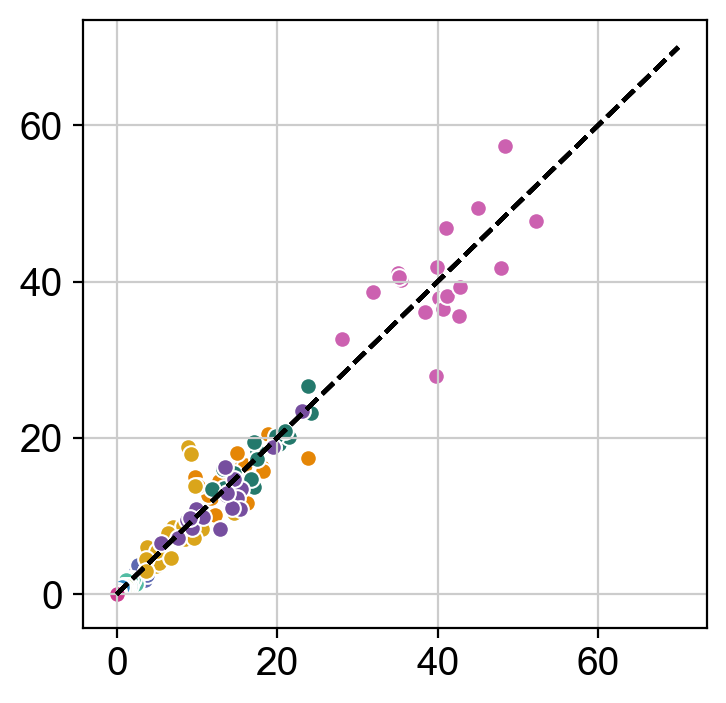

In [25]:
cors = pd.Series()
for ct_i in range(0,10) : 
    ct = ['cM', 'ncM', 'cDC', 'pDC', 'Th', 'Tc', 'NK', 'ProlifT', 'B','Progen'][ct_i]
    ax = sns.scatterplot(ind_perc2_ucsf_rep1_pivot.loc[ct].values, ind_perc2_ucsf_rep2_pivot.loc[ct].values, color=adata.uns['ct_cov_colors'][ct_i])
    cors[ct] = np.corrcoef(ind_perc2_ucsf_rep1_pivot.loc[ct].values,ind_perc2_ucsf_rep2_pivot.loc[ct].values)[0,1]
    ax.plot([0,70], [0,70], '--', color='#000000')
print(cors)
cors.mean()

mono      0.816500
mk             NaN
cdc       0.397317
pdc       0.610807
lymph     0.832027
progen         NaN
dtype: float64


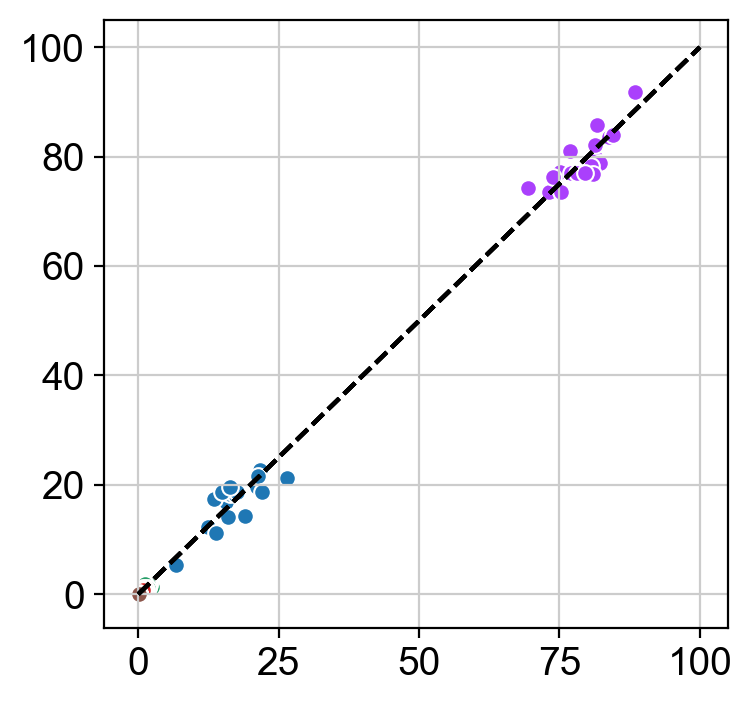

In [26]:
cors = pd.Series()
for ct in ["mono","mk","cdc","pdc","lymph","progen"] :
    ax=sns.scatterplot(ind_perc2_ucsf_rep1_cg_cov_pivot.loc[ct].values, ind_perc2_ucsf_rep2_cg_cov_pivot.loc[ct].values)
    cors[ct] = np.corrcoef(ind_perc2_ucsf_rep1_cg_cov_pivot.loc[ct].values,ind_perc2_ucsf_rep2_cg_cov_pivot.loc[ct].values)[0,1]
    ax.plot([0,100], [0,100], '--', color='#000000')
print(cors)

cM         0.016596
ncM       -0.023642
cDC        0.046753
pDC        0.215326
Th         0.191543
Tc        -0.130342
NK         0.029131
ProlifT    0.089134
B          0.303465
Progen          NaN
dtype: float64


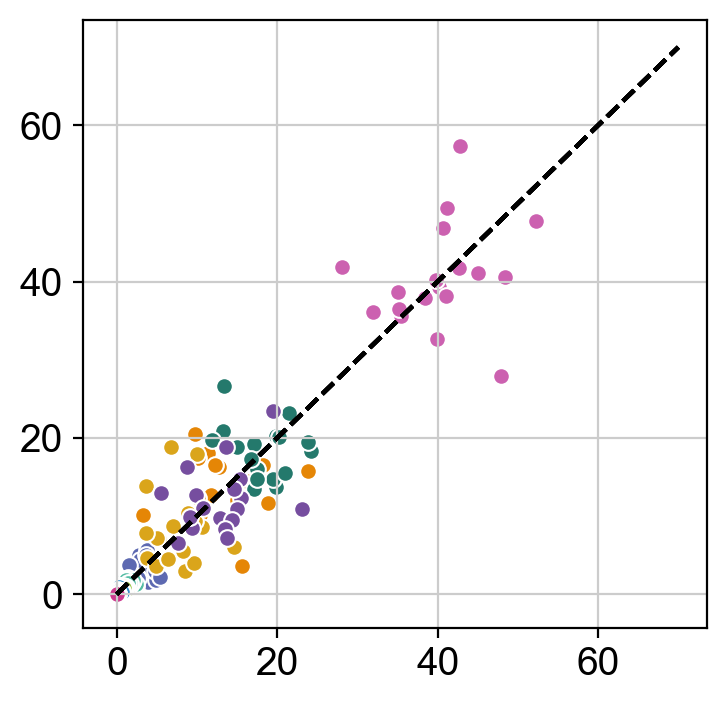

In [27]:
cors = pd.Series()
for ct_i in range(0,10) : 
    ct = ['cM', 'ncM', 'cDC', 'pDC', 'Th', 'Tc', 'NK', 'ProlifT', 'B','Progen'][ct_i]
    shuffled = shuffle(ind_perc2_ucsf_rep2_pivot.loc[ct].values);
    ax = sns.scatterplot(ind_perc2_ucsf_rep1_pivot.loc[ct].values, shuffled, color=adata.uns['ct_cov_colors'][ct_i])
    cors[ct] = np.corrcoef(ind_perc2_ucsf_rep1_pivot.loc[ct].values, shuffled)[0,1]
    ax.plot([0,70], [0,70], '--', color='#000000')
print(cors)

mono     -0.471488
mk             NaN
cdc       0.239084
pdc      -0.401031
lymph     0.214981
progen         NaN
dtype: float64


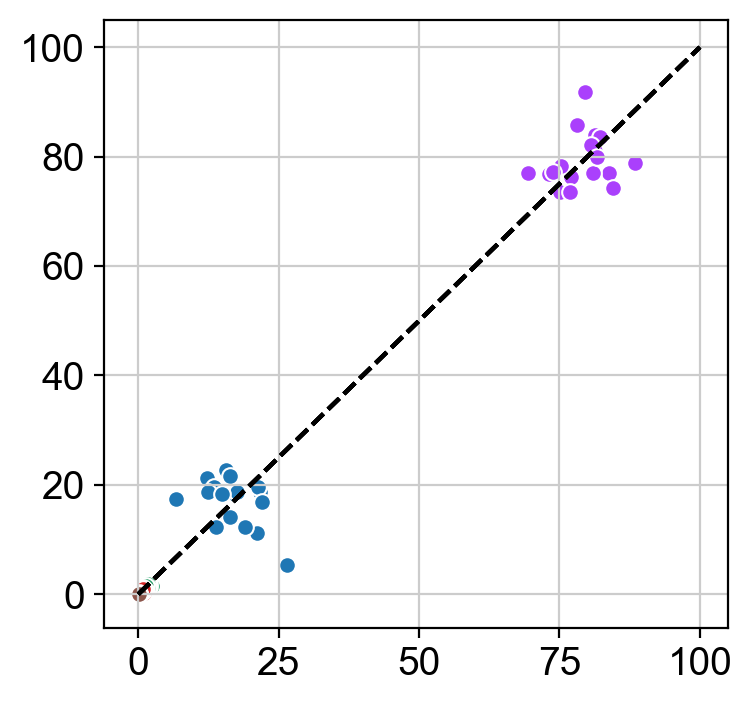

In [28]:
cors = pd.Series()
for ct in ["mono","mk","cdc","pdc","lymph","progen"] :
    shuffled = shuffle(ind_perc2_ucsf_rep2_cg_cov_pivot.loc[ct].values);
    ax = sns.scatterplot(ind_perc2_ucsf_rep1_cg_cov_pivot.loc[ct].values, shuffled)
    cors[ct] = np.corrcoef(ind_perc2_ucsf_rep1_cg_cov_pivot.loc[ct].values, shuffled)[0,1]
    ax.plot([0,100], [0,100], '--', color='#000000')
print(cors)

### Compare UCSF controls with Broad controls

In [29]:
ind_perc2_sorted = ind_perc2.sort_values(by=["ind_cov","batch_cov"],ascending=True)
ind_perc_all = ind_perc[ind_perc.disease_cov=="healthy"].append(ind_perc2_sorted[~ind_perc2_sorted.duplicated(["ct_cov","ind_cov"], keep="first")])

ind_perc_all_duplicated = ind_perc_all[ind_perc_all.duplicated(["ct_cov","ind_cov"], keep=False)]

ind_perc_all_rep1 = ind_perc_all_duplicated[ind_perc_all_duplicated.duplicated(["ct_cov","ind_cov"], keep="first")]
ind_perc_all_rep2 = ind_perc_all_duplicated[ind_perc_all_duplicated.duplicated(["ct_cov","ind_cov"], keep="last")]

ind_perc_all_rep1_pivot = ind_perc_all_rep1.pivot_table(index=["ct_cov"], columns=["ind_cov"], values="ct_perc")
ind_perc_all_rep1_cg_cov = ind_perc_all_rep1.groupby(["ind_cov","cg_cov"])["ct_perc"].sum()
ind_perc_all_rep1_cg_cov = ind_perc_all_rep1_cg_cov.reset_index(name="cg_perc")
ind_perc_all_rep1_cg_cov_pivot = ind_perc_all_rep1_cg_cov.pivot_table(index=["cg_cov"], columns=["ind_cov"], values="cg_perc")

ind_perc_all_rep2_pivot = ind_perc_all_rep2.pivot_table(index=["ct_cov"], columns=["ind_cov"], values="ct_perc")
ind_perc_all_rep2_cg_cov = ind_perc_all_rep2.groupby(["ind_cov","cg_cov"])["ct_perc"].sum()
ind_perc_all_rep2_cg_cov = ind_perc_all_rep2_cg_cov.reset_index(name="cg_perc")
ind_perc_all_rep2_cg_cov_pivot = ind_perc_all_rep2_cg_cov.pivot_table(index=["cg_cov"], columns=["ind_cov"], values="cg_perc")

print(ind_perc_all_rep1.shape)
print(ind_perc_all_rep2.shape)

(221, 10)
(221, 10)


cM         0.846029
ncM        0.883475
cDC        0.704806
pDC        0.461128
Th         0.891099
Tc         0.929931
NK         0.854678
ProlifT    0.835443
B          0.954415
Progen          NaN
dtype: float64


0.8178895434650144

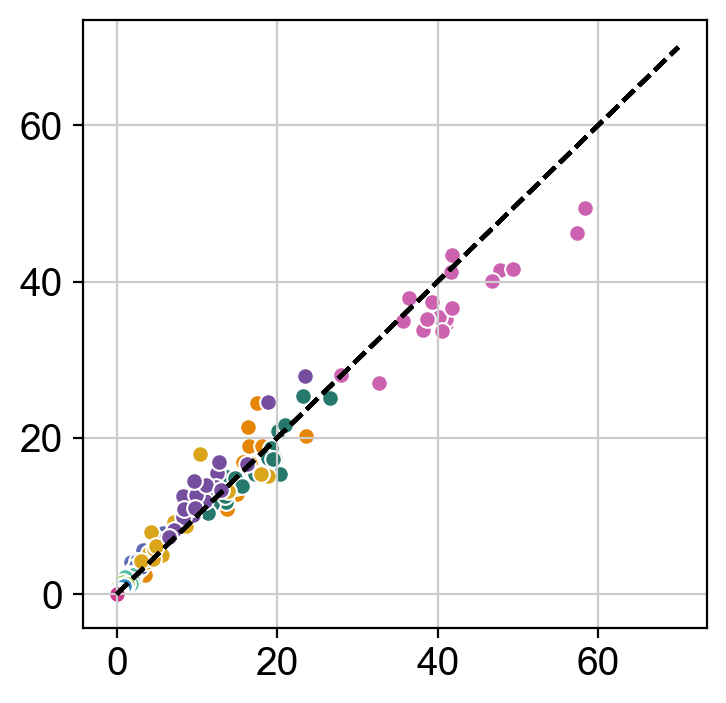

In [30]:
cors = pd.Series()
for ct_i in range(0,10) : 
    ct = ['cM', 'ncM', 'cDC', 'pDC', 'Th', 'Tc', 'NK', 'ProlifT', 'B','Progen'][ct_i]
    ax = sns.scatterplot(ind_perc_all_rep1_pivot.loc[ct].values, ind_perc_all_rep2_pivot.loc[ct].values,  color=adata.uns['ct_cov_colors'][ct_i])
    cors[ct] = np.corrcoef(ind_perc_all_rep1_pivot.loc[ct].values, ind_perc_all_rep2_pivot.loc[ct].values)[0,1]
    ax.plot([0,70], [0,70], '--', color='#000000')
print(cors)
cors.mean()

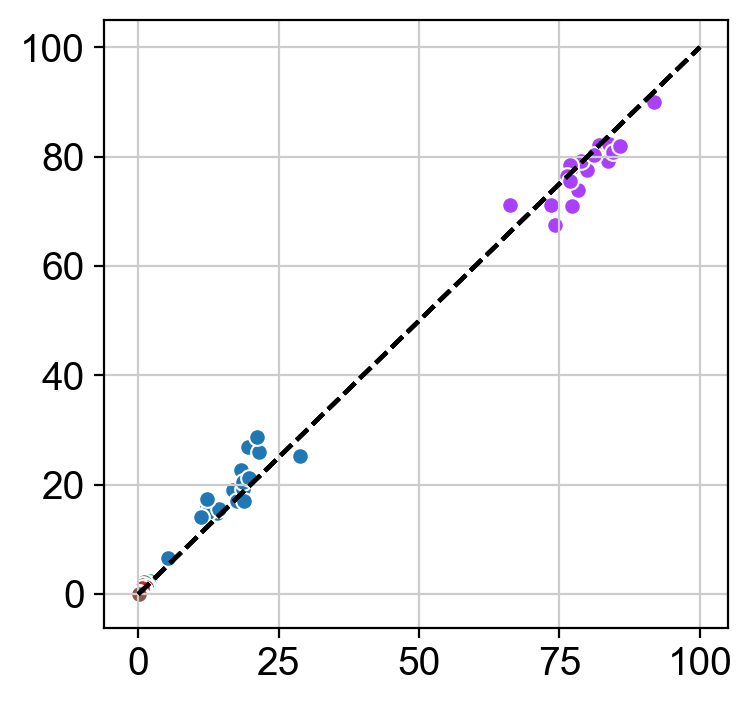

In [31]:
for ct in ["mono","mk","cdc","pdc","lymph","progen"] :
    ax = sns.scatterplot(ind_perc_all_rep1_cg_cov_pivot.loc[ct].values, ind_perc_all_rep2_cg_cov_pivot.loc[ct].values)
    ax.plot([0,100], [0,100], '--', color='#000000')

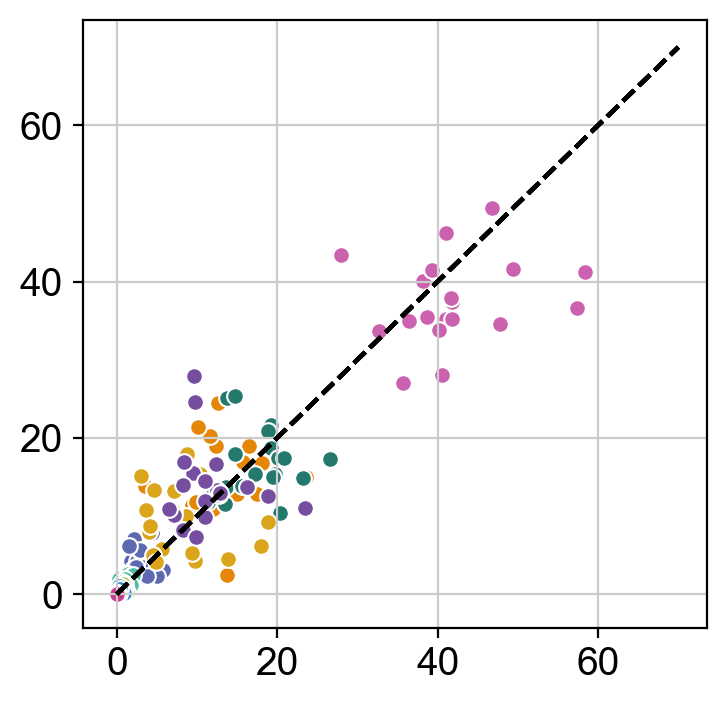

In [32]:
for ct_i in range(0,10) : 
    ct = ['cM', 'ncM', 'cDC', 'pDC', 'Th', 'Tc', 'NK', 'ProlifT', 'B','Progen'][ct_i]
    ax = sns.scatterplot(ind_perc_all_rep1_pivot.loc[ct].values, shuffle(ind_perc_all_rep2_pivot.loc[ct].values), color=adata.uns['ct_cov_colors'][ct_i])
    ax.plot([0,70], [0,70], '--', color='#000000')

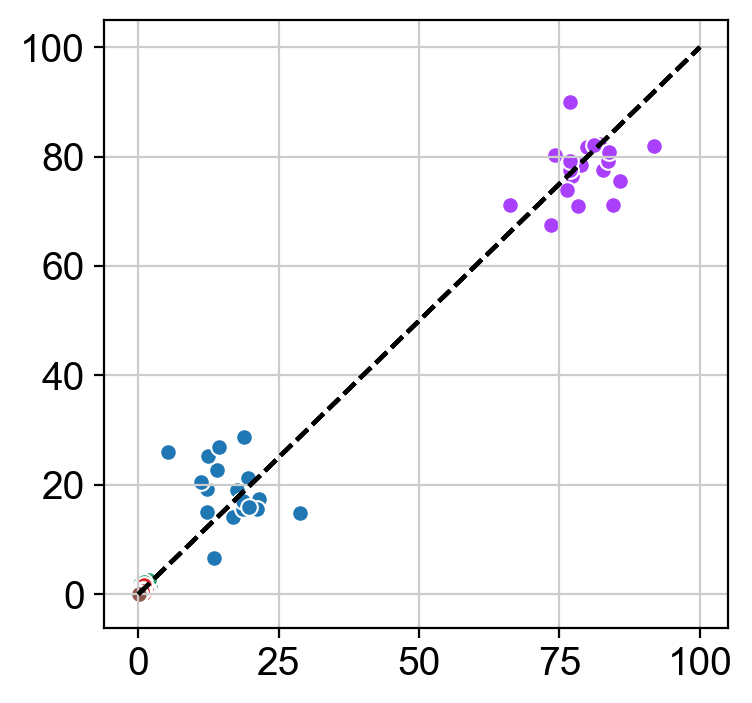

In [33]:
for ct in ["mono","mk","cdc","pdc","lymph","progen"] :
    ax = sns.scatterplot(ind_perc_all_rep1_cg_cov_pivot.loc[ct].values, shuffle(ind_perc_all_rep2_cg_cov_pivot.loc[ct].values))
    ax.plot([0,100], [0,100], '--', color='#000000')

## Figure 1F: Cell type proportion differences between case/control using all controls

In [34]:
## Make proportion plots (Fig. 1D)

##adata_obs_small = adata.obs[(adata.obs.study_cov=="ImmVar") & (adata.obs.ind_cov.str.contains("IGTB")) | (~adata.obs.ind_cov.str.contains("IGTB") & (adata.obs.study_cov=="CLUES"))]
##adata_obs_small = adata.obs[(adata.obs.well.str.contains("immvar")) & (adata.obs.ind_cov.str.contains("IGTB")) | (~adata.obs.ind_cov.str.contains("IGTB") & ~adata.obs.well.str.contains("immvar"))]
adata_obs_small = adata.obs;##[(adata.obs.batch_cov.str.contains("lupus"))]

##ind_count = adata_obs_small.groupby(['ind_cov','study_cov','ct_cov','disease_cov','pop_cov','batch_cov'])['ct_cov'].count()

## no batch_cov so that we aggregate the count for the two healthy controls
ind_count = adata_obs_small.groupby(['ind_cov','ct_cov','disease_cov','pop_cov','batch_cov','site'])['ct_cov'].count()

##ind_count = adata.obs.groupby(['ind_cov','study_cov','ct_cov','disease_cov','pop_cov'])['ct_cov'].count()
##ind_count = adata.obs.groupby(['ind_cov','ct_cov','disease_cov','pop_cov'])['ct_cov'].count()

ind_count_sums = ind_count.groupby(["ind_cov","batch_cov","disease_cov","pop_cov","site"]).sum()
ind_count_sums = ind_count_sums.reset_index(name="pbmc_counts")

ind_count = ind_count.reset_index(name="counts")


In [35]:
## Make proportion plots (Fig. 1D)

##adata_obs_small = adata.obs[(adata.obs.study_cov=="ImmVar") & (adata.obs.ind_cov.str.contains("IGTB")) | (~adata.obs.ind_cov.str.contains("IGTB") & (adata.obs.study_cov=="CLUES"))]
##adata_obs_small = adata.obs[(adata.obs.well.str.contains("immvar")) & (adata.obs.ind_cov.str.contains("IGTB")) | (~adata.obs.ind_cov.str.contains("IGTB") & ~adata.obs.well.str.contains("immvar"))]
adata_obs_small = adata.obs;##[(adata.obs.batch_cov.str.contains("lupus"))]

##ind_count = adata_obs_small.groupby(['ind_cov','study_cov','ct_cov','disease_cov','pop_cov','batch_cov'])['ct_cov'].count()

## no batch_cov so that we aggregate the count for the two healthy controls
ind_count = adata_obs_small.groupby(['ind_cov','ct_cov','disease_cov','pop_cov','batch_cov','site'])['ct_cov'].count()

##ind_count = adata.obs.groupby(['ind_cov','study_cov','ct_cov','disease_cov','pop_cov'])['ct_cov'].count()
##ind_count = adata.obs.groupby(['ind_cov','ct_cov','disease_cov','pop_cov'])['ct_cov'].count()

ind_count_sums = ind_count.groupby(["ind_cov","batch_cov","disease_cov","pop_cov","site"]).sum()
ind_count_sums = ind_count_sums.reset_index(name="pbmc_counts")

ind_count = ind_count.reset_index(name="counts")

ind_perc = ind_count;
ind_perc['ct_perc'] = ind_count["counts"]/ind_count.groupby(["ind_cov","batch_cov"]).transform(sum)["counts"]*100

# Add weights to WLS
ind_perc['ct_counts'] = ind_count["counts"].values.tolist()

## filter samples that have < 100 cells
ind_perc = ind_perc[ind_perc.ind_cov.isin(ind_count_sums.ind_cov[ind_count_sums.pbmc_counts > 100])]
ind_count_sums = ind_count_sums[ind_count_sums.pbmc_counts > 100];

In [36]:
print("ind_perc.shape: ",ind_perc.shape)
print("ind_count_sums.shape: ", ind_count_sums.shape)
print("len(ind_perc.ind_cov): ", len(ind_perc.ind_cov))
print("len(ind_perc.ind_cov.unique): ", len(ind_perc.ind_cov.unique()))

## for now, let's filter out one of the reps for the healthies from UCSF only
## and filter out any broad samples that were replicated at UCSF
ind_perc_broad = ind_perc[~ind_perc.batch_cov.str.contains("lupus")]
ind_perc_ucsf = ind_perc[ind_perc.batch_cov.str.contains("lupus")].drop_duplicates(subset=['ct_cov','ind_cov'])
ind_perc_all = ind_perc_ucsf.append(ind_perc_broad);

ind_count_sums_broad = ind_count_sums[~ind_count_sums.batch_cov.str.contains("lupus")]
ind_count_sums_ucsf = ind_count_sums[ind_count_sums.batch_cov.str.contains("lupus")].drop_duplicates(subset=['ind_cov'])
ind_count_sums_all = ind_count_sums_ucsf.append(ind_count_sums_broad);

ind_perc.shape:  (2421, 9)
ind_count_sums.shape:  (206, 6)
len(ind_perc.ind_cov):  2421
len(ind_perc.ind_cov.unique):  169


In [37]:
cg_cov = pd.DataFrame( {'ct_cov':['B','cM','ncM', 'Th', 'Tc', 'NK', 'ProlifT', 'cDC', 'pDC', 'MK', 'Progen'], 'cg_cov':['lymph', 'mono', 'mono', 'lymph','lymph', 'lymph', 'lymph', 'dc','dc', 'mk', 'progen']})
ind_perc_all.ind_cov = ind_perc_all.ind_cov.apply(lambda x: x.split('_')[0])
ind_count_sums_all.ind_cov = ind_count_sums_all.ind_cov.apply(lambda x: x.split('_')[0])
ind_perc_all = ind_perc_all.set_index('ct_cov').join(cg_cov.set_index('ct_cov'))
ind_perc_all.ind_cov = ind_perc_all.ind_cov.astype("str")
ind_perc_all.batch_cov = ind_perc_all.batch_cov.astype("str")
ind_perc_all.reset_index(inplace=True)
ind_perc_all.ct_cov = ind_perc_all.ct_cov.astype('category')
ind_perc_all.ct_cov = ind_perc_all.ct_cov.cat.reorder_categories(adata.obs.ct_cov.cat.categories.values)
## do this to get monos and lympho to have similar colors as the major cell types
ind_perc_all.cg_cov = ind_perc_all.cg_cov.astype('category')
ind_perc_all.cg_cov = ind_perc_all.cg_cov.cat.reorder_categories(["mono", "dc", "mk", "progen","lymph"])

### Plot the proportion differences

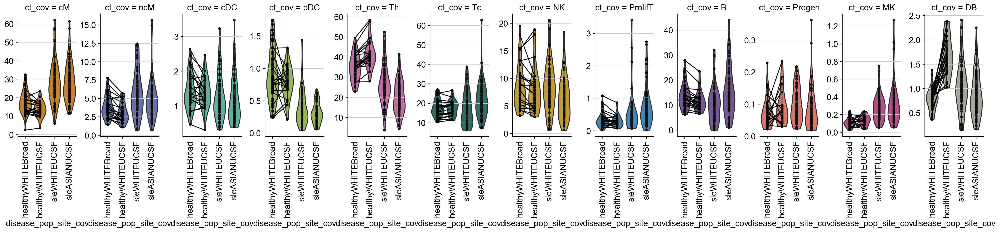

In [38]:
adata.uns['ct_cov_colors'] = ["#E58606","#5D69B1","#52BCA3","#99C945","#CC61B0","#24796C","#DAA51B","#2F8AC4","#764E9F","#ED645A","#CC3A8E","#A5AA99"]

ind_perc_all['site'] = pd.Categorical(ind_perc_all.disease_cov, categories=['Broad','UCSF'])
ind_perc_all.site[ind_perc_all.batch_cov.str.contains("immvar")] = "Broad"
ind_perc_all.site[~ind_perc_all.batch_cov.str.contains("immvar")] = "UCSF"

ind_perc_all['disease_pop_cov'] = pd.Categorical(ind_perc_all.apply(lambda row: row['disease_cov'] + row['pop_cov'], axis=1),
                                             categories=['healthyWHITE','sleWHITE','sleASIAN'],
                                             ordered=True)

ind_perc_all['disease_pop_site_cov'] = pd.Categorical(ind_perc_all.apply(lambda row: row['disease_cov'] + row['pop_cov'] + row['site'], axis=1),
                                             categories=['healthyWHITEBroad','healthyWHITEUCSF','sleWHITEUCSF','sleASIANUCSF'],
                                             ordered=True)
perc_plot = sns.catplot(x='disease_pop_site_cov', y='ct_perc', hue='ct_cov', data=ind_perc_all, kind='violin', col='ct_cov', aspect=0.5, height=4,
                        dodge=False, sharex=False, sharey=False, cut=0, palette=adata.uns['ct_cov_colors'])
perc_plot.set_xticklabels(rotation=90)
perc_plot.fig.subplots_adjust(wspace=0.4)
##perc_plot.tight_layout()

for ct_i in list(range(len(ind_perc_all.ct_cov.cat.categories))) :
    ct = ind_perc_all.ct_cov.cat.categories[ct_i]
    sns.pointplot(x="disease_pop_site_cov", y="ct_perc", hue = "ind_cov", data=ind_perc_all[ind_perc_all.ct_cov == ct], color="0", scale=0.5, ax=perc_plot.axes[0,ct_i], legend=False)

    perc_plot.axes[0,ct_i].get_yaxis().label.set_visible(False)
    perc_plot.axes[0,ct_i].get_legend().remove()
    
perc_plot.savefig(figdir+"/violin_ct_cov_pop_site.png")




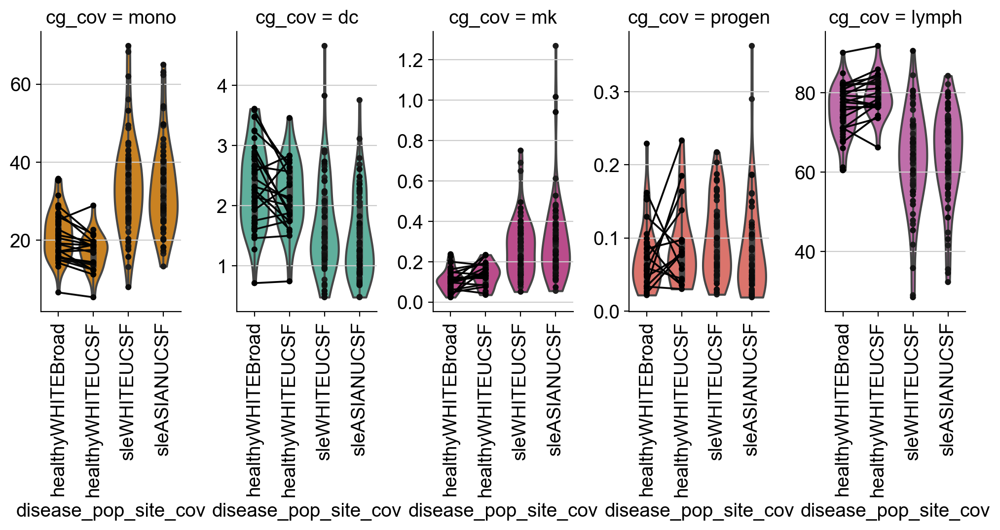

In [39]:
ind_group = ind_perc_all.groupby(['ind_cov','cg_cov','disease_cov','pop_cov','batch_cov','disease_pop_site_cov'])['ct_perc'].sum()
##ind_group = ind_perc_all.groupby(['ind_cov','cg_cov','disease_cov','disease_pop_site_cov'])['ct_perc'].sum()

ind_group = ind_group.reset_index(name="cg_perc").dropna()
##ind_group.cg_cov = ind_group.cg_cov.astype('category')

group_plot = sns.catplot(x='disease_pop_site_cov', y='cg_perc', hue='cg_cov', data=ind_group, kind='violin', col='cg_cov', aspect=0.55, height=4, 
                        dodge=False, sharex=False, sharey=False, cut=0, palette = ["#E58606","#52BCA3","#CC3A8E","#ED645A","#CC61B0"])##,"#24796C","#DAA51B","#2F8AC4","#764E9F",,"#A5AA99"])
group_plot.set_xticklabels(rotation=90)
group_plot.fig.subplots_adjust(wspace=0.4)
##perc_plot.tight_layout()

for cg_i in list(range(len(ind_group.cg_cov.cat.categories))) :
    cg = ind_group.cg_cov.cat.categories[cg_i]
    ##sns.swarmplot(x="disease_pop_site_cov", y="cg_perc", data=ind_group[ind_group.cg_cov == cg], color="0", size=3, ax=group_plot.axes[0,cg_i])
    sns.pointplot(x="disease_pop_site_cov", y="cg_perc", hue = "ind_cov", data=ind_group[ind_group.cg_cov == cg], color="0", scale=0.5, ax=group_plot.axes[0,cg_i], legend=False)

    group_plot.axes[0,cg_i].get_yaxis().label.set_visible(False)
    group_plot.axes[0,cg_i].get_legend().remove()

group_plot.savefig(figdir+"/violin_cg_cov_pop_site.png")

### Perform ordinarly least squares test

In [40]:
ind_perc_all_nodups = ind_perc_all.drop_duplicates(subset=['ct_cov','ind_cov']);
ind_count_sums_all_nodups = ind_count_sums_all.drop_duplicates(subset=['ind_cov']);

print('as a proportion of total PBMC ')

all_out = pd.DataFrame();

for ct_i in list(range(11)) :
    ct = ind_perc_all_nodups.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc_all_nodups.ct_perc[ind_perc_all_nodups.ct_cov==ct]
    disease = ind_perc_all_nodups.disease_cov[ind_perc_all_nodups.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    ##print('Cell type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
display(all_out) 
##print(all_out)

print('\nwhite sle vs white healthy')

white_out = pd.DataFrame();

for ct_i in list(range(11)) :
    ct = ind_perc_all_nodups.ct_cov.cat.categories[ct_i]
    ind_perc_all_nodups_small = ind_perc_all_nodups[ind_perc_all_nodups.pop_cov=="WHITE"];
    ct_perc = ind_perc_all_nodups_small.ct_perc[ind_perc_all_nodups_small.ct_cov==ct]
    disease = ind_perc_all_nodups_small.disease_cov[ind_perc_all_nodups_small.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    ##print('Cell type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    white_out = white_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
display(white_out)  
##print(white_out)

print('\nasian sle vs white healthy')

asian_sle_white_out = pd.DataFrame();

for ct_i in list(range(11)) :
    ct = ind_perc_all_nodups.ct_cov.cat.categories[ct_i]
    ind_perc_all_nodups_small = ind_perc_all_nodups[((ind_perc_all_nodups.pop_cov=="WHITE") & (ind_perc_all_nodups.disease_cov=="healthy")) | ((ind_perc_all_nodups.pop_cov=="ASIAN") & (ind_perc_all_nodups.disease_cov=="sle"))]
    ct_perc = ind_perc_all_nodups_small.ct_perc[ind_perc_all_nodups_small.ct_cov==ct]
    disease = ind_perc_all_nodups_small.disease_cov[ind_perc_all_nodups_small.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    ##print('Cell type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    asian_sle_white_out = asian_sle_white_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
display(asian_sle_white_out); ##print(white_out)    
     
print('\nwhite sle vs asian sle')

asian_white_sle_out = pd.DataFrame();

for ct_i in list(range(11)) :
    ct = ind_perc_all_nodups.ct_cov.cat.categories[ct_i]
    ind_perc_all_nodups_small = ind_perc_all_nodups[ind_perc_all_nodups.disease_cov=="sle"];
    ct_perc = ind_perc_all_nodups_small.ct_perc[ind_perc_all_nodups_small.ct_cov==ct]
    pop = ind_perc_all_nodups_small.pop_cov[ind_perc_all_nodups_small.ct_cov==ct]
    pop = pop.astype("str")
    pop.values[pop=="ASIAN"] = 0
    pop.values[pop=="WHITE"] = 1
    pop = sm.add_constant(pop)
    ##data = data.assign(ct_perc=ct_perc)
    ##print('Cell type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), pop.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    asian_white_sle_out = asian_white_sle_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
display(asian_white_sle_out); ##print(white_out)    

as a proportion of total PBMC 


/Users/yimmieg/opt/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2495: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


,Beta,Cell,Pval
0,-11.277005718762318,cM,1.9320204420698577e-10
1,-1.7325704486789344,ncM,9.09048927921578e-05
2,0.12863753324479796,cDC,0.21110719498504552
3,0.5268892866784982,pDC,1.4249193650055864e-23
4,13.56387411074396,Th,1.9495492236229838e-15
5,-1.3367201452485413,Tc,0.32366518381786447
6,0.5505191282665935,NK,0.44114544681456413
7,-0.3429413959741494,ProlifT,0.00013621368323832604
8,-0.0728335664072379,B,0.9569477294186953
9,-0.011094732145807577,Progen,0.31542224931084634



white sle vs white healthy


,Beta,Cell,Pval
0,-11.21726515318175,cM,1.691320438862728e-08
1,-2.270052960536501,ncM,8.246268034615848e-06
2,0.07410890316500031,cDC,0.5096535689006872
3,0.49297930898816267,pDC,9.358264089630113e-13
4,10.217408533169134,Th,9.305876210932269e-08
5,0.8825683062583598,Tc,0.5219821093561912
6,-0.4241045164840104,NK,0.6151486939054813
7,-0.22956036627064946,ProlifT,0.008609779749772839
8,2.563539814001141,B,0.03651594650206175
9,-0.01860439240807861,Progen,0.0981899839676499



asian sle vs white healthy


,Beta,Cell,Pval
0,-11.330108443722834,cM,7.393388576040853e-10
1,-1.254808215916654,ncM,0.0029023831511797516
2,0.17710742664906254,cDC,0.10418138329343767
3,0.5575176536246073,pDC,4.182692095282919e-19
4,16.538510179699365,Th,6.126189824304976e-19
5,-3.3094209910324617,Tc,0.0177789910870075
6,1.4168512569337972,NK,0.05775203895101882
7,-0.44372453348837193,ProlifT,3.1742414655705893e-06
8,-2.4162765712146905,B,0.10966419464019282
9,-0.003873904970547002,Progen,0.7677399368800546



white sle vs asian sle


,Beta,Cell,Pval
0,-0.11284329054107889,cM,0.9560930706967696
1,1.015244744619849,ncM,0.05660346245722441
2,0.10299852348406185,cDC,0.40295112103088204
3,0.06453834463644452,pDC,0.09763413436984711
4,6.321101646530215,Th,0.00025579142573854783
5,-4.191989297290824,Tc,0.012016137178439404
6,1.840955773417806,NK,0.02090695699894659
7,-0.2141641672177223,ProlifT,0.05534651490539877
8,-4.979816385215837,B,0.0023593102548782057
9,0.014730487437531598,Progen,0.23277746027709656


### Perform weighted OLS by the number of cells per cluster

In [41]:
print('as a proportion of total PBMC ')

all_out = pd.DataFrame();

for ct_i in list(range(11)) :
    ct = ind_perc_all_nodups.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc_all_nodups.ct_perc[ind_perc_all_nodups.ct_cov==ct]
    disease = ind_perc_all_nodups.disease_cov[ind_perc_all_nodups.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    weights = ind_perc_all_nodups.ct_counts[ind_perc_all_nodups.ct_cov==ct]
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    ##print('Cell type:'+ ct)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)    
display(all_out)
all_out.to_csv('all_out_ct_counts.'+version+'.txt')

print('\nwhite sle vs white healthy')

white_out = pd.DataFrame();

for ct_i in list(range(11)) :
    ct = ind_perc_all_nodups.ct_cov.cat.categories[ct_i]
    ind_perc_all_nodups_small = ind_perc_all_nodups[ind_perc_all_nodups.pop_cov=="WHITE"];
    ct_perc = ind_perc_all_nodups_small.ct_perc[ind_perc_all_nodups_small.ct_cov==ct]
    disease = ind_perc_all_nodups_small.disease_cov[ind_perc_all_nodups_small.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    weights = ind_perc_all_nodups_small.ct_counts[ind_perc_all_nodups_small.ct_cov==ct]
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    ##print('Cell type:'+ ct)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    white_out = white_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
display(white_out); ##print(white_out)

asian_sle_white_out = pd.DataFrame();

print('\nasian sle vs white healthy')

for ct_i in list(range(11)) :
    ct = ind_perc_all_nodups.ct_cov.cat.categories[ct_i]
    ind_perc_all_nodups_small = ind_perc_all_nodups[((ind_perc_all_nodups.pop_cov=="WHITE") & (ind_perc_all_nodups.disease_cov=="healthy")) | ((ind_perc_all_nodups.pop_cov=="ASIAN") & (ind_perc_all_nodups.disease_cov=="sle"))]
    ct_perc = ind_perc_all_nodups_small.ct_perc[ind_perc_all_nodups_small.ct_cov==ct]
    disease = ind_perc_all_nodups_small.disease_cov[ind_perc_all_nodups_small.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    weights = ind_perc_all_nodups_small.ct_counts[ind_perc_all_nodups_small.ct_cov==ct]
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    ##print('Cell type:'+ ct)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    asian_sle_white_out = asian_sle_white_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
display(asian_sle_white_out); ##print(white_out)    
    
print('\nwhite sle vs asian sle')

asian_white_sle_out = pd.DataFrame();

for ct_i in list(range(11)) :
    ct = ind_perc_all_nodups.ct_cov.cat.categories[ct_i]
    ind_perc_all_nodups_small = ind_perc_all_nodups[ind_perc_all_nodups.disease_cov=="sle"];
    ct_perc = ind_perc_all_nodups_small.ct_perc[ind_perc_all_nodups_small.ct_cov==ct]
    pop = ind_perc_all_nodups_small.pop_cov[ind_perc_all_nodups_small.ct_cov==ct]
    pop = pop.astype("str")
    pop.values[pop=="ASIAN"] = 0
    pop.values[pop=="WHITE"] = 1
    pop = sm.add_constant(pop)
    weights = ind_perc_all_nodups_small.ct_counts[ind_perc_all_nodups_small.ct_cov==ct]
    ##data = data.assign(ct_perc=ct_perc)
    ##print('Cell type:'+ ct)
    est=sm.WLS(ct_perc.astype(float), pop.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    asian_white_sle_out = asian_white_sle_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
display(asian_white_sle_out); ##print(white_out)    
    

as a proportion of total PBMC 


,Beta,Cell,Pval
0,-13.19826502027316,cM,7.282480360894808e-08
1,-2.72306293899299,ncM,4.023741337733732e-05
2,-0.0777657720804173,cDC,0.5235640490207039
3,0.5713771610194378,pDC,2.3899756140282227e-22
4,11.230136073970884,Th,1.0450999719021313e-11
5,-4.465948874041662,Tc,0.007600794196040527
6,-0.583874019527755,NK,0.4512628599490288
7,-0.7922609422256548,ProlifT,4.954958408876485e-05
8,-4.993569243313441,B,0.0023601776989892707
9,-0.012335037249740248,Progen,0.3950029887210815



white sle vs white healthy


,Beta,Cell,Pval
0,-13.401534515827686,cM,8.76257396351146e-08
1,-3.3387526076026903,ncM,2.1743726040033695e-07
2,-0.1311093273434405,cDC,0.30809141765986936
3,0.4982223748485412,pDC,7.466802112883862e-10
4,7.791095232097396,Th,4.7391820119356494e-05
5,-2.6278421914479195,Tc,0.08966301377563952
6,-1.4314594931596198,NK,0.10403482949919415
7,-0.7185393488292735,ProlifT,0.00023431367534814876
8,-0.88800839868526,B,0.4995450713672608
9,-0.008882564263423653,Progen,0.4813699652756519



asian sle vs white healthy


,Beta,Cell,Pval
0,-13.027945208622022,cM,6.274479826618097e-08
1,-2.0969554297307584,ncM,0.0014047327973025561
2,-0.028415047919136738,cDC,0.8210754290901086
3,0.6462695905673153,pDC,1.3579376412749785e-17
4,15.113715500520303,Th,1.757234156225149e-16
5,-5.720159292888368,Tc,0.001287820703235242
6,0.31854076201248194,NK,0.6911387579705008
7,-0.8363308137934269,ProlifT,3.6879985698883854e-06
8,-7.260571224393136,B,7.422022368703232e-05
9,-0.01613829626140454,Progen,0.36547435227806824



white sle vs asian sle


,Beta,Cell,Pval
0,0.3735893072056622,cM,0.8680613984516845
1,1.2417971778719314,ncM,0.051660995815176865
2,0.10269427942430404,cDC,0.46822029567619805
3,0.14804721571877383,pDC,0.0018626891995933747
4,7.322620268422915,Th,3.0364213453838158e-05
5,-3.0923171014404516,Tc,0.10027836833447351
6,1.7500002551721043,NK,0.030349573757888333
7,-0.11779146496415274,ProlifT,0.48770231147407295
8,-6.372562825707868,B,0.0006738193128836361
9,-0.00725573199798088,Progen,0.6181734826406315


### Perform weighted OLS by total number of cells per sample

In [42]:
print('as a proportion of total PBMC ')

all_out = pd.DataFrame();

for ct_i in list(range(11)) :
    ct = ind_perc_all_nodups.ct_cov.cat.categories[ct_i]
    ##print(ct);
    ct_perc = ind_perc_all_nodups.ct_perc[ind_perc_all_nodups.ct_cov==ct]
    disease = ind_perc_all_nodups.disease_cov[ind_perc_all_nodups.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    weights = ind_count_sums_all_nodups[ind_count_sums_all_nodups.ind_cov.isin(ind_perc_all_nodups.ind_cov[ind_perc_all_nodups.ct_cov==ct])].pbmc_counts;
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    ##print('Cell type:'+ ct)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    logfc = math.log2(sum(est.params)/est.params[0])
    #print(effect)
    #print(pval)
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval), "LogFC": str(logfc)}), ignore_index=True)
    #print(effect)
    #print(pval)
display(all_out)

all_out.to_csv('all_out_pbmc_counts.'+version+'.txt')

print('\nwhite sle vs white healthy')

white_out = pd.DataFrame();

for ct_i in list(range(11)) :
    ct = ind_perc_all_nodups.ct_cov.cat.categories[ct_i]
    ind_perc_all_nodups_small = ind_perc_all_nodups[ind_perc_all_nodups.pop_cov=="WHITE"];
    ct_perc = ind_perc_all_nodups_small.ct_perc[ind_perc_all_nodups_small.ct_cov==ct]
    disease = ind_perc_all_nodups_small.disease_cov[ind_perc_all_nodups_small.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    weights = ind_count_sums_all_nodups[ind_count_sums_all_nodups.ind_cov.isin(ind_perc_all_nodups_small.ind_cov[ind_perc_all_nodups_small.ct_cov==ct])].pbmc_counts;
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    ##print('Cell type:'+ ct)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    logfc = math.log2(sum(est.params)/est.params[0])
    #print(effect)
    #print(pval)
    white_out = white_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval), "LogFC": str(logfc)}), ignore_index=True)
display(white_out); ##print(white_out)

asian_sle_white_out = pd.DataFrame();

print('\nasian sle vs white healthy')

for ct_i in list(range(11)) :
    ct = ind_perc_all_nodups.ct_cov.cat.categories[ct_i]
    ind_perc_all_nodups_small = ind_perc_all_nodups[((ind_perc_all_nodups.pop_cov=="WHITE") & (ind_perc_all_nodups.disease_cov=="healthy")) | ((ind_perc_all_nodups.pop_cov=="ASIAN") & (ind_perc_all_nodups.disease_cov=="sle"))]
    ct_perc = ind_perc_all_nodups_small.ct_perc[ind_perc_all_nodups_small.ct_cov==ct]
    disease = ind_perc_all_nodups_small.disease_cov[ind_perc_all_nodups_small.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    weights = ind_count_sums_all_nodups[ind_count_sums_all_nodups.ind_cov.isin(ind_perc_all_nodups_small.ind_cov[ind_perc_all_nodups_small.ct_cov==ct])].pbmc_counts;
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    ##print('Cell type:'+ ct)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    logfc = math.log2(sum(est.params)/est.params[0])
    #print(effect)
    #print(pval)
    asian_sle_white_out = asian_sle_white_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval), "LogFC": str(logfc)}), ignore_index=True)
display(asian_sle_white_out); ##print(white_out)    
    
print('\nwhite sle vs asian sle')

asian_white_sle_out = pd.DataFrame();

for ct_i in list(range(11)) :
    ct = ind_perc_all_nodups.ct_cov.cat.categories[ct_i]
    ind_perc_all_nodups_small = ind_perc_all_nodups[ind_perc_all_nodups.disease_cov=="sle"];
    ct_perc = ind_perc_all_nodups_small.ct_perc[ind_perc_all_nodups_small.ct_cov==ct]
    pop = ind_perc_all_nodups_small.pop_cov[ind_perc_all_nodups_small.ct_cov==ct]
    pop = pop.astype("str")
    pop.values[pop=="ASIAN"] = 0
    pop.values[pop=="WHITE"] = 1
    pop = sm.add_constant(pop)
    weights = ind_count_sums_all_nodups[ind_count_sums_all_nodups.ind_cov.isin(ind_perc_all_nodups_small.ind_cov[ind_perc_all_nodups_small.ct_cov==ct])].pbmc_counts;
     ##data = data.assign(ct_perc=ct_perc)
    ##print('Cell type:'+ ct)
    est=sm.WLS(ct_perc.astype(float), pop.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    logfc = math.log2(sum(est.params)/est.params[0])
    #print(effect)
    #print(pval)
    asian_white_sle_out = asian_white_sle_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval), "LogFC": str(logfc)}), ignore_index=True)
display(asian_white_sle_out); ##print(white_out)    
    

as a proportion of total PBMC 


,Beta,Cell,LogFC,Pval
0,-10.74142131074505,cM,-0.6887710566546117,1.684609656529878e-08
1,-1.6742194009077176,ncM,-0.5581042433372931,0.0005316672172402089
2,0.13125795717366495,cDC,0.14767770138323252,0.23755755261300698
3,0.5457223411567754,pDC,1.3802206455290074,5.15573064875286e-24
4,13.335545671765423,Th,0.6569801055457304,1.778756140293641e-13
5,-1.3251414780715687,Tc,-0.10049816214039495,0.362666947593665
6,0.30140282522765693,NK,0.05809782022507549,0.6799076265990389
7,-0.33624304888249434,ProlifT,-1.1018015246975483,0.00042934875739662943
8,-0.187297777848358,B,-0.021202215692427542,0.8989435435717881
9,-0.00949716664002322,Progen,-0.16215092601029488,0.41505580065041725



white sle vs white healthy


,Beta,Cell,LogFC,Pval
0,-10.634383811700864,cM,-0.6833031867780881,1.7272658681208536e-07
1,-2.205211100113185,ncM,-0.6978960284661347,3.839706739895817e-05
2,0.07024760962761428,cDC,0.07715132659545772,0.5497942981012145
3,0.5129829392574178,pDC,1.2477446956692821,1.2682486051594438e-13
4,9.661476175453815,Th,0.444214083144383,8.86283810520902e-07
5,0.9144265127298503,Tc,0.07367166266238644,0.5298825591851939
6,-0.628735539414997,NK,-0.11414868547502674,0.43625028404595256
7,-0.2213704818398387,ProlifT,-0.8111701488500729,0.012459770420686272
8,2.6710852877664886,B,0.34214679026921735,0.032811652179106095
9,-0.018671035552317788,Progen,-0.303177456380867,0.1020956223025227



asian sle vs white healthy


,Beta,Cell,LogFC,Pval
0,-10.831736106557651,cM,-0.6933686039114064,2.784095865824587e-08
1,-1.2261856994464189,ncM,-0.42860693311274456,0.006684233968872476
2,0.18273652431397783,cDC,0.20999065081915788,0.11212065428807451
3,0.5737787516330446,pDC,1.5043098547807041,2.3737415817428297e-20
4,16.435607232655453,Th,0.8646768569392639,4.193535980644005e-18
5,-3.2148168498229808,Tc,-0.2326873791558723,0.026622376573521372
6,1.08622363317169,NK,0.22136520255549347,0.1412654753152667
7,-0.4331688228361985,ProlifT,-1.3083826589091578,1.5525694815823296e-05
8,-2.5991093880825265,B,-0.2695648232843094,0.1089638572240433
9,-0.0011850521689605476,Progen,-0.02125661913686608,0.9286545415773131



white sle vs asian sle


,Beta,Cell,LogFC,Pval
0,-0.19735229485678762,cM,-0.01006541713331821,0.9239013469495734
1,0.9790254006667666,ncM,0.2692890953533909,0.06935571063338741
2,0.11248891468636359,cDC,0.13283932422370026,0.35906878676743204
3,0.06079581237562663,pDC,0.2565651591114218,0.11192894967805604
4,6.77413105720164,Th,0.4204627737948808,8.209216187493617e-05
5,-4.129243362552832,Tc,-0.30635904181825857,0.012192971190528033
6,1.714959172586688,NK,0.3355138880305206,0.027691226331651244
7,-0.21179834099635997,ProlifT,-0.4972125100590841,0.05200349575290786
8,-5.270194675849016,B,-0.6117116135535271,0.0014030413170777333
9,0.017485983383357207,Progen,0.2819208372440004,0.14351978650060734


# Figure 1E: Correlation with EHR

## Some initial data wrangling to read in clinical and lab results

ok, there should be 127 lupus patients and 42 immvar donors, we only have estimated PBMC numbers for 11 of them so the final joined table will only have 

In [43]:
## Let's grab the clinical and labs data and compare to our single cell estimates
clues_clinical = pd.read_csv("../meta/Clinical_Data.V2.txt", index_col=False, sep="\t")
clues_clinical.genotypeid = clues_clinical.genotypeid.apply(lambda x: x.split('_')[0])
clues_clinical.subjectid = clues_clinical.subjectid.astype("str")
joined = ind_perc_all.join(ind_count_sums_all.set_index(['ind_cov','batch_cov','disease_cov','pop_cov','site']), on=['ind_cov','batch_cov','disease_cov','pop_cov','site']);
joined = joined.join(clues_clinical.set_index('genotypeid'), on='ind_cov')
##joined = ind_perc.join(clues_clinical.set_index('genotypeid'), on='ind_cov')

t1_labs = pd.read_csv("../meta/Lab_Data.V1.csv",sep=",")
t1_labs.SubjectID = t1_labs.SubjectID.astype("str")
joined = joined.join(t1_labs.set_index('SubjectID'), on='subjectid')

### test new code
joined.AbsBaso = joined.AbsBaso/1000
joined.AbsEosino = joined.AbsEosino/1000
joined.AbsLympho = joined.AbsLympho/1000
joined.AbsNeutro = joined.AbsNeutro/1000
joined.AbsMono = joined.AbsMono/1000

joined = joined.assign(pbmc = joined.WhiteBloodCell-joined.AbsNeutro-joined.AbsEosino-joined.AbsBaso)

##joined[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']] = joined[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']].astype(str)

## now let's add in white blood cell counts for the immvar patients
immvar_pbmc = pd.read_csv("../meta/ImmVar_PBMC_Counts.csv", index_col=False, sep=",")
immvar_pbmc.pbmc = immvar_pbmc.pbmc - (np.mean(immvar_pbmc.pbmc) - np.mean(joined.pbmc))
## this is not the most efficient code but will suffice for now
for i in list(range(12)) :
    igtb = immvar_pbmc.immvarid[i]
    joined.pbmc[joined.ind_cov==igtb] = immvar_pbmc.pbmc[i]

joined.pbmc = joined.pbmc.fillna(0)
joined = joined.assign(estimate=joined.ct_perc/100*joined.pbmc)

joined['disease_pop_cov'] = joined.apply(lambda row: row['disease_cov'] + row['pop_cov'], axis=1)
joined['disease_pop_site_cov'] = pd.Categorical(joined.apply(lambda row: row['disease_cov'] + row['pop_cov'] + row['site'], axis=1),
                                             categories=['healthyWHITEBroad','healthyWHITEUCSF','sleWHITEUCSF','sleASIANUCSF'],
                                             ordered=True)

joined[["ind_cov","disease_cov","ct_cov",'cg_cov',"disease_pop_cov","disease_pop_site_cov"]] = joined[["ind_cov","disease_cov","ct_cov",'cg_cov',"disease_pop_cov","disease_pop_site_cov"]].astype('str')
# joined.plaquenilnow = joined.plaquenilnow.fillna(0)
# joined.cellceptnow = joined.cellceptnow.fillna(0)
# joined.steroralnow = joined.steroralnow.fillna(0)
# joined.acrlymphopenia = joined.acrlymphopenia.fillna(0)
# joined.sledaiscore = joined.sledaiscore.fillna(0)
# joined.WhiteBloodCell = joined.WhiteBloodCell.fillna(0)
# joined.AbsMono = joined.AbsMono.fillna(0)
# joined.AbsLympho = joined.AbsLympho.fillna(0)
# joined.AbsNeutro = joined.AbsNeutro.fillna(0)
# joined.AbsEosino = joined.AbsEosino.fillna(0)
# joined.AbsBaso = joined.AbsBaso.fillna(0)
# joined.PlatCount = joined.PlatCount.fillna(0)
# joined.pbmc = joined.pbmc.fillna(0)
# joined.subjectid = joined.subjectid.fillna(0)
# joined.CreatinineUrine = joined.CreatinineUrine.fillna(0)
# joined.ProteinUrine = joined.CreatinineUrine.fillna(0)
# joined.ProCreatRatio = joined.ProCreatRatio.fillna(0)
# joined.CreatinineSerum = joined.CreatinineSerum.fillna(0)
# joined.antidsDNANum = joined.antidsDNANum.fillna(0)
# joined.C3Num = joined.C3Num.fillna(0)
# joined.ANATiter1 = joined.ANATiter1.fillna(0)
# joined.sledaiantidsdna = joined.sledaiantidsdna.fillna(0)
# joined.sledaileukopenia = joined.sledaileukopenia.fillna(0)
# joined.sledailowcomp = joined.sledailowcomp.fillna(0)
# joined.sledaiproteinuria = joined.sledaiproteinuria.fillna(0)
# joined.sledaipyuria = joined.sledaipyuria.fillna(0)
# joined.acrantismith = joined.acrantismith.fillna(0)
# joined.acrlupneph = joined.acrlupneph.fillna(0)
# joined.sleactivity = joined.sleactivity.fillna(0)

joined.to_csv(name+"_joined."+version+".txt")

/Users/yimmieg/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [44]:
##indices = ['ind_cov',"disease_cov","disease_pop_cov","disease_pop_site_cov","batch_cov", "pbmc","counts","plaquenilnow","cellceptnow","steroralnow","acrlymphopenia","sledaiscore"];
indices = ['ind_cov',"disease_cov","disease_pop_cov","disease_pop_site_cov","batch_cov", "pbmc","pbmc_counts","plaquenilnow","cellceptnow","steroralnow",
           "acrlymphopenia","sledaiscore",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount','CreatinineUrine','ProteinUrine',
           'ProCreatRatio','CreatinineSerum','antidsDNANum','C3Num','ANATiter1','sledaiseizures', 'sledaipsychosis', 'sledaiobrainsyn',
       'sledaivisdisturb', 'sledaicranialnd', 'sledaisleheadache', 'sledaicva',
       'sledaivasculitis', 'sledaiarthritis', 'sledaimyositis', 'sledairash',
       'sledaialopecia', 'sledaimucosalulcers', 'sledaipleurisy',
       'sledaipericarditis', 'sledaifever', 'sledaiurinarycasts',
       'sledaihematuria', 'sledaiproteinuria', 'sledaipyuria', 'sledailowcomp',
       'sledaiantidsdna', 'sledaithrombocytopenia', 'sledaileukopenia','sledainone','acrantismith','acrlupneph','sleactivity','agedx','sleflare','cancer','kidney'];

for index in indices:
    joined[index] = joined[index].fillna(0)
    
joined.subjectid = joined.subjectid.fillna(0)
##indices = ['ind_cov',"disease_pop_site_cov","disease_cov","pbmc","plaquenilnow","cellceptnow","steroralnow","acrlymphopenia","AbsMono","AbsLympho","CreatinineUrine","CreatinineSerum","antidsDNANum","ANATiter1","C3Num","ProCreatRatio","ProteinUrine"]

# ehr_indices = ['subjectid','cg_cov','WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount','CreatinineUrine','ProteinUrine','ProCreatRatio','CreatinineSerum','antidsDNANum','C3Num','ANATiter1']
# ehr_nocg_indices = ['subjectid','WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount','CreatinineUrine','ProteinUrine','ProCreatRatio','CreatinineSerum','antidsDNANum','C3Num','ANATiter1']
# ehr_quantitative_indices = ['WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount','CreatinineUrine','ProteinUrine','ProCreatRatio','CreatinineSerum','antidsDNANum','C3Num','ANATiter1']
ehr_indices = ['subjectid','cg_cov'];
ehr_nocg_indices = ['subjectid'];
ehr_quantitative_indices = ['WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount','CreatinineUrine','ProteinUrine','ProCreatRatio','CreatinineSerum','antidsDNANum','C3Num','ANATiter1']

joined_pivot = joined.pivot_table(index=indices, columns=["ct_cov"], values=["estimate"])
joined_pivot.reset_index(inplace=True)
## this should get rid of the few samples with 0 cells
joined_pivot = joined_pivot[joined_pivot.pbmc_counts >0];

joined_pivot.to_csv(name+"_joined_pivot_ct_estimates."+version+".txt")

## this does not require the pbmc counts
joined_pivot_perc = joined.pivot_table(index=indices, columns="ct_cov", values="ct_perc")
joined_pivot_perc.reset_index(inplace=True)
## this should get rid of the few samples with 0 cells
joined_pivot_perc = joined_pivot_perc[joined_pivot_perc.pbmc_counts >0];
joined_pivot_perc.to_csv(name+"_joined_pivot_ct_perc."+version+".txt")


# # ## this does not require the pbmc counts
# joined_pivot_leiden_perc = joined.pivot_table(index=indices, columns="ct_cov", values="leiden")
# joined_pivot_leiden_perc.reset_index(inplace=True)
# joined_pivot_leiden_perc.to_csv(name+"_joined_pivot_leiden_perc.txt")


joined_pivot.disease_cov = pd.Categorical(joined_pivot.disease_cov,categories=['healthy','sle'], ordered=True)

##filter joined
joined = joined[joined.pbmc >= 0]
joined = joined[joined.pbmc < 10]

joined_pivot = joined_pivot[joined_pivot.pbmc >= 0]
joined_pivot = joined_pivot[joined_pivot.pbmc < 10]


##joined_agg = joined.groupby(['ind_cov','subjectid','disease_cov','ct_group','WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount','pbmc'])['ct_perc'].sum()

##joined_agg = joined.groupby(['ind_cov','subjectid','disease_cov','disease_pop_cov','ct_group','plaquenilnow','cellceptnow','steroralnow',"acrlymphopenia","sledaiscore",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount','pbmc'])['ct_perc'].sum()
joined_agg = joined.groupby(indices+ehr_indices)['ct_perc'].sum()
joined_agg = joined_agg.reset_index(name='cg_perc')

##joined_agg[['WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount','pbmc']] = joined_agg[['WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount','pbmc']].astype(float)
joined_agg[ehr_quantitative_indices]  = joined_agg[ehr_quantitative_indices].astype(float)

joined_agg = joined_agg.assign(estimate=joined_agg.cg_perc/100*joined_agg.pbmc)
joined_agg[["subjectid","disease_cov","cg_cov"]] = joined_agg[["subjectid","disease_cov","cg_cov"]].astype(str)
joined_agg_pivot = joined_agg.pivot_table(index=indices+ehr_nocg_indices, columns="cg_cov", values="estimate")
##joined_agg_pivot = joined_agg.pivot_table(index=['ind_cov', "subjectid", "pbmc","disease_cov","disease_pop_cov","disease_pop_site_cov","batch_cov",'plaquenilnow','cellceptnow','steroralnow',"acrlymphopenia","sledaiscore","WhiteBloodCell","AbsMono",'AbsBaso',"AbsLympho","AbsNeutro","AbsEosino","PlatCount"], columns="cg_cov", values="estimate")
joined_agg_pivot.reset_index(inplace=True);

joined_agg[ehr_quantitative_indices] = joined_agg[ehr_quantitative_indices].astype(float);
joined_agg_pivot[ehr_quantitative_indices] = joined_agg_pivot[ehr_quantitative_indices].astype(float)

##joined_agg[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']] = joined_agg[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']].astype(float)
##joined_agg_pivot[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']] = joined_agg_pivot[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']].astype(float)

joined_agg_pivot.to_csv(name+"_joined_pivot_cg_estimates."+version+".txt")

##joined_agg_pivot_perc = joined_agg.pivot_table(index=['ind_cov', "subjectid", "pbmc","disease_cov",'disease_pop_cov',"disease_pop_site_cov","batch_cov",'plaquenilnow','cellceptnow','steroralnow',"acrlymphopenia","sledaiscore","WhiteBloodCell","AbsMono",'AbsBaso',"AbsLympho","AbsNeutro","AbsEosino","PlatCount"], columns="cg_cov", values="cg_perc")
joined_agg_pivot_perc = joined_agg.pivot_table(index=indices+ehr_nocg_indices, columns="cg_cov", values="cg_perc")
joined_agg_pivot_perc.reset_index(inplace=True);
joined_agg_pivot_perc = joined_agg_pivot_perc.assign(PercMono = joined_agg_pivot_perc.AbsMono/joined_agg_pivot_perc.pbmc*100)
joined_agg_pivot_perc = joined_agg_pivot_perc.assign(PercLympho = joined_agg_pivot_perc.AbsLympho/joined_agg_pivot_perc.pbmc*100)

##joined_agg[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']] = joined_agg[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']].astype(float)
##joined_agg_pivot_perc[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']] = joined_agg_pivot[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']].astype(float)
joined_agg_pivot_perc[ehr_quantitative_indices] = joined_agg_pivot[ehr_quantitative_indices].astype(float)
joined_agg_pivot_perc.to_csv(name+"_joined_pivot_cg_perc."+version+".txt")

## filter for some really bad samples
joined_agg_pivot_clues = joined_agg_pivot[joined_agg_pivot.AbsMono > 5/1000]
joined_agg_pivot_clues = joined_agg_pivot_clues[joined_agg_pivot.AbsLympho > 5/1000]
joined_agg_pivot_clues = joined_agg_pivot_clues[joined_agg_pivot.WhiteBloodCell > 0]

joined_agg_clues = joined_agg[joined_agg.AbsMono > 5/1000]
joined_agg_clues = joined_agg_clues[joined_agg.AbsLympho > 5/1000]
joined_agg_clues = joined_agg_clues[joined_agg.WhiteBloodCell > 0]


## filter for some really bad samples
joined_agg_pivot_perc_clues = joined_agg_pivot_perc[joined_agg_pivot_perc.AbsMono > 5/1000]
joined_agg_pivot_perc_clues = joined_agg_pivot_perc_clues[joined_agg_pivot_perc.AbsLympho > 5/1000]
joined_agg_pivot_perc_clues = joined_agg_pivot_perc_clues[joined_agg_pivot_perc.WhiteBloodCell > 0]

/Users/yimmieg/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/Users/yimmieg/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:93: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/Users/yimmieg/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/Users/yimmieg/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:97: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/Users/yimmieg/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:102: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/Users/yimmieg/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:103: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


## Figure 1E: Plot correlation for monocytes and lymphocytes

(0.9636705439272795, 5.078862069316812e-62)
(0.8806096448814706, 7.689982853953282e-36)


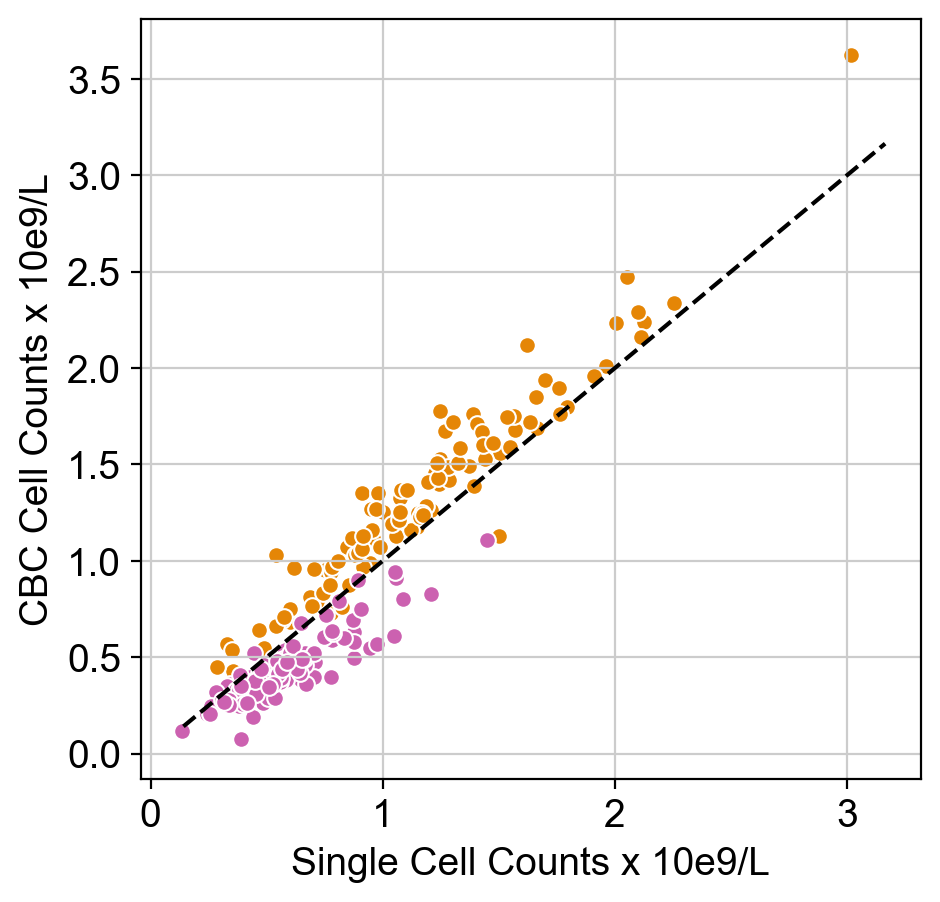

In [45]:
## calculate correlation
lympho_cor = stats.pearsonr(joined_agg_pivot_clues.lymph, joined_agg_pivot_clues.AbsLympho)
mono_cor = stats.pearsonr(joined_agg_pivot_clues.mono, joined_agg_pivot_clues.AbsMono)

fig,ax = plt.subplots(nrows=1,ncols=1, figsize=(5,5))
#fig.tight_layout()

##palette = ["#E58606","#5D69B1","#52BCA3","#99C945","#CC61B0","#24796C","#DAA51B","#2F8AC4","#764E9F","#ED645A","#CC3A8E","#A5AA99"]
    
sns.scatterplot(x='lymph', y='AbsLympho', data=joined_agg_pivot_clues, color='#E58606',ax=ax)
ax.plot(ax.get_xlim(), ax.get_xlim(), '--', color='#000000')

sns.scatterplot(x='mono', y='AbsMono', data=joined_agg_pivot_clues, color='#CC61B0',ax=ax)
ax.set(xlabel="Single Cell Counts x 10e9/L", ylabel="CBC Cell Counts x 10e9/L")

##ax[1].set(xlabel="Single Cell Counts x 10e9/L", ylabel="CBC Cell Counts x 10e9/L")
##ax[1].plot(ax[1].get_xlim(), ax[1].get_xlim(), '--', color='#000000')

fig.savefig(figdir+"ct_corr.png")

print(lympho_cor)
print(mono_cor)

(0.8156292855079867, 1.058163745686127e-26)
(0.8575819467724248, 4.340316903467193e-32)


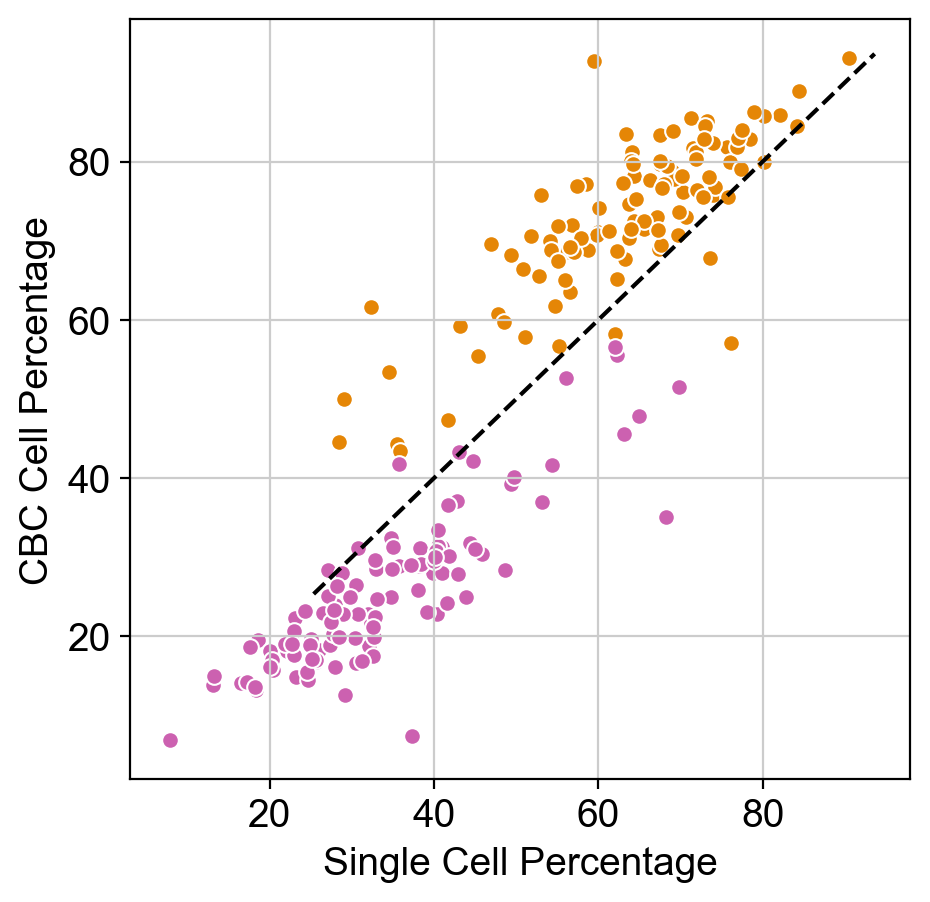

In [46]:
## calculate correlation
lympho_cor = stats.pearsonr(joined_agg_pivot_perc_clues.lymph, joined_agg_pivot_perc_clues.PercLympho)
mono_cor = stats.pearsonr(joined_agg_pivot_perc_clues.mono, joined_agg_pivot_perc_clues.PercMono)

fig,ax = plt.subplots(nrows=1,ncols=1, figsize=(5,5))
#fig.tight_layout()


sns.scatterplot(x='lymph', y='PercLympho', data=joined_agg_pivot_perc_clues, color='#E58606',ax=ax)
ax.plot(ax.get_xlim(), ax.get_xlim(), '--', color='#000000')

sns.scatterplot(x='mono', y='PercMono', data=joined_agg_pivot_perc_clues, color='#CC61B0',ax=ax)
ax.set(xlabel="Single Cell Percentage", ylabel="CBC Cell Percentage")

##ax[1].set(xlabel="Single Cell Counts x 10e9/L", ylabel="CBC Cell Counts x 10e9/L")
##ax[1].plot(ax[1].get_xlim(), ax[1].get_xlim(), '--', color='#000000')

fig.savefig(figdir+"ct_corr_perc.png")

print(lympho_cor)
print(mono_cor)

# Figure 1G: EHR differences

/Users/yimmieg/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


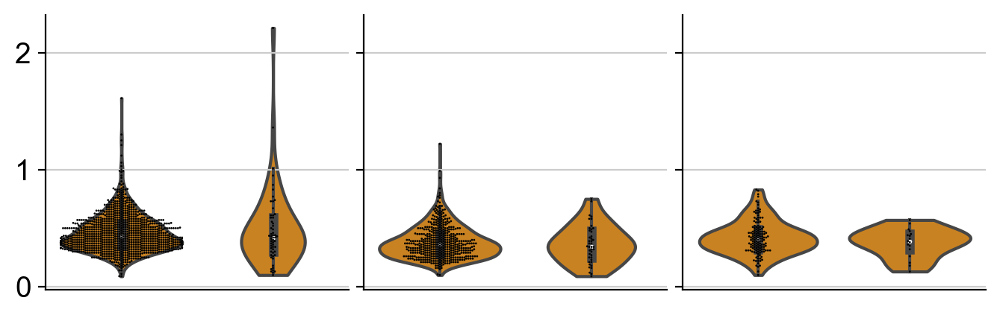

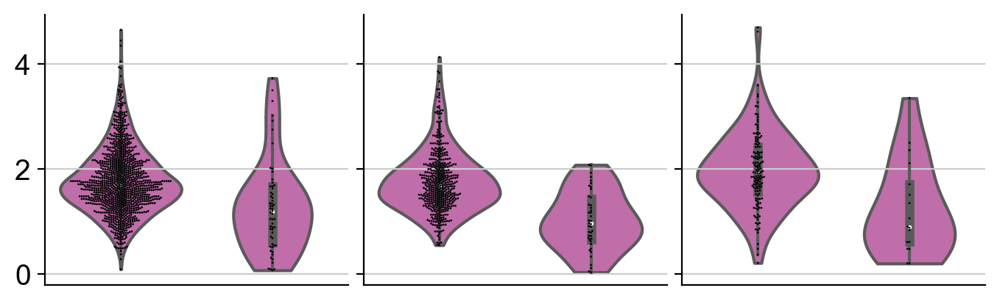

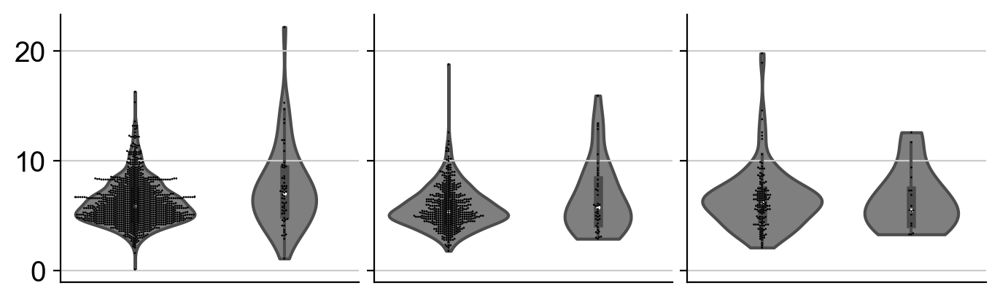

In [47]:
## Now let's analyze the EHR data
## Now let's analyze the EHR data
ehr = pd.read_table("../meta/EHR_Data.csv", sep=",")
ehr_pivot = ehr.pivot_table(index=['Patient_ID',"Lab_Age","Patient_Sex","Patient_Race","CASE"],columns="Lab_Name",values="Lab_Value")
ehr_pivot.reset_index(inplace=True)
ehr_pivot = ehr_pivot[ehr_pivot['monocyte abs count'] < 5]
ehr_pivot = ehr_pivot[ehr_pivot['lymphocyte abs cnt'] < 6]
ehr_pivot = ehr_pivot.rename(columns={'monocyte abs count': 'monocyte_cnt',
                         'lymphocyte abs cnt': 'lymphocyte_cnt',
                         'wbc count': 'wbc_cnt'})

ehr_pivot_small = ehr_pivot[ehr_pivot.Patient_Race.isin(['White or Caucasian', 'Black or African American', 'Asian'])]

##ehr_pivot_small_melt = ehr_pivot_small.melt(id_vars=['Patient_Race','CASE'], value_vars=["lymphocyte abs cnt", "monocyte abs count", "wbc count"])
ehr_pivot_small_melt = ehr_pivot_small.melt(id_vars=['Patient_Race','CASE'], value_vars=["lymphocyte_cnt", "monocyte_cnt", "wbc_cnt"])

for cg_i in [0, 1, 2] :
    cg = ['monocyte_cnt', 'lymphocyte_cnt', 'wbc_cnt'][cg_i]
    ehr_plot = sns.catplot(x='CASE', y=cg, col='Patient_Race', data=ehr_pivot_small, kind='violin', color=["#E58606","#CC61B0",'#7f7f7f'][cg_i], height = 3, aspect=0.9, dodge=False, sharex=False, sharey=True, cut=0)
    ehr_plot.fig.subplots_adjust(wspace=0.05)
    
    for r_i in [0,1,2] :
        race = ['White or Caucasian', 'Asian', 'Black or African American'][r_i]
        sns.swarmplot(x="CASE", y=cg, data=ehr_pivot_small[ehr_pivot.Patient_Race==race], color="0", size=1, ax=ehr_plot.axes[0,r_i])
        ehr_plot.axes[0,r_i].get_yaxis().label.set_visible(False)
        ehr_plot.axes[0,r_i].get_xaxis().label.set_visible(False)
        ehr_plot.axes[0,r_i].get_xaxis().set_visible(False)
        ##ehr_plot.axes[0,r_i].get_xaxis().ticklabels.set_visible(False)
        ##ehr_plot.axes[0,r_i].setxaxislabelsticklabels.set_visible(False)
        ehr_plot.set_titles(row_template = '', col_template = '')

    ##ax[cg_i,r_i].get_xaxis().set_visible(False)
    ##ax[cg_i,r_i].get_yaxis().label.set_visible(False)
    ##    ehr_plot.set_xticklabels(rotation=90)
    ehr_plot.savefig(figdir+cg+"_violin_ehr.png")

##fig.savefig(figdir+"/ehr.violin.png")